# CSE4062 Data Science - Delivery #2

## Göksel Tokur - 150116049

## Arda Bayram-150116029

## Gülnihal Erdem - 150319554

## İrem Seçmen - 170219006

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

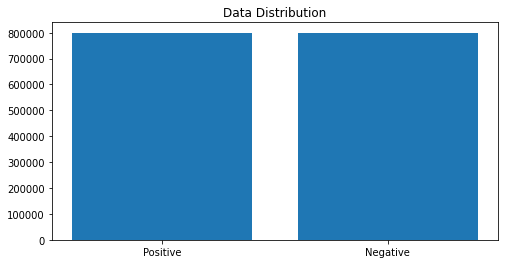

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gokse\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

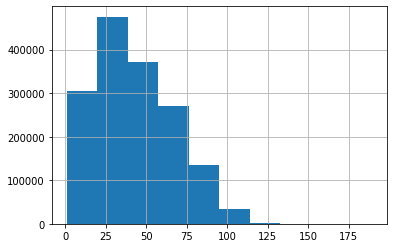

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


<AxesSubplot:ylabel='letter'>

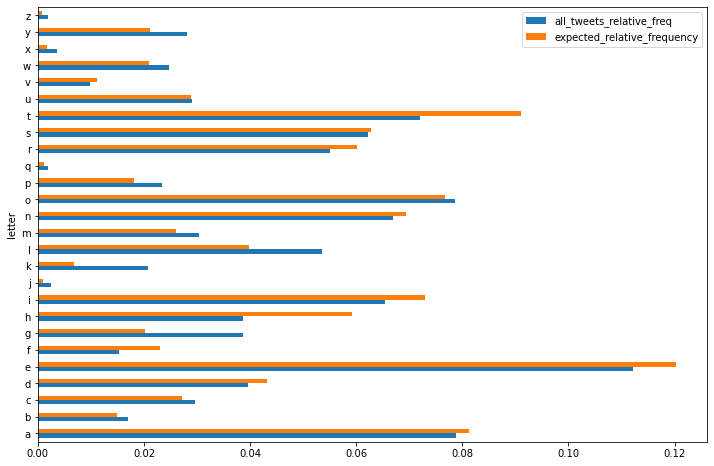

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.158961650697616

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805719796

### Positives + Negatives

<BarContainer object of 20 artists>

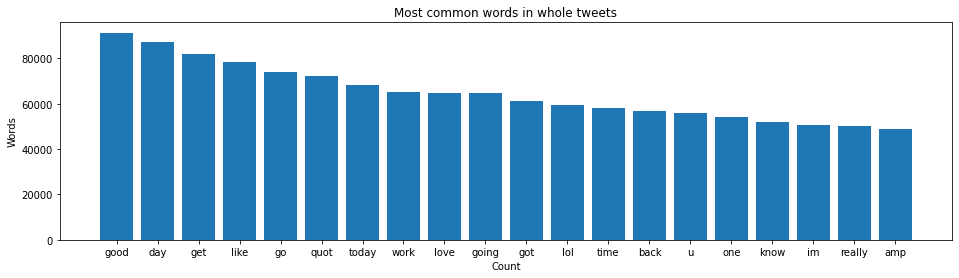

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

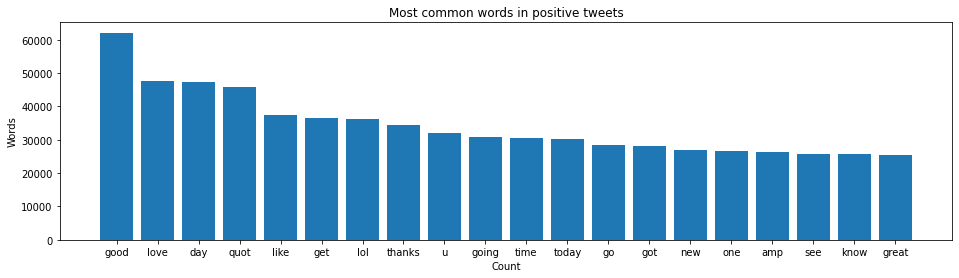

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

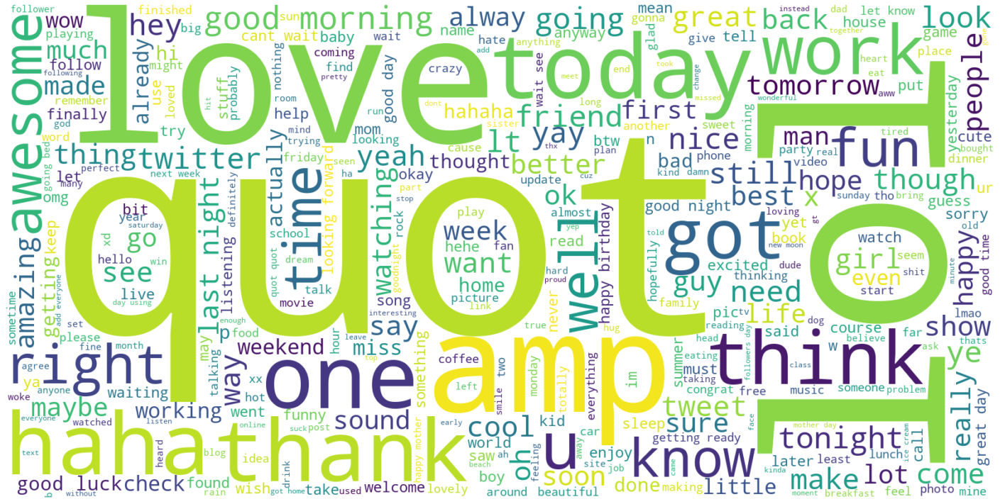

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

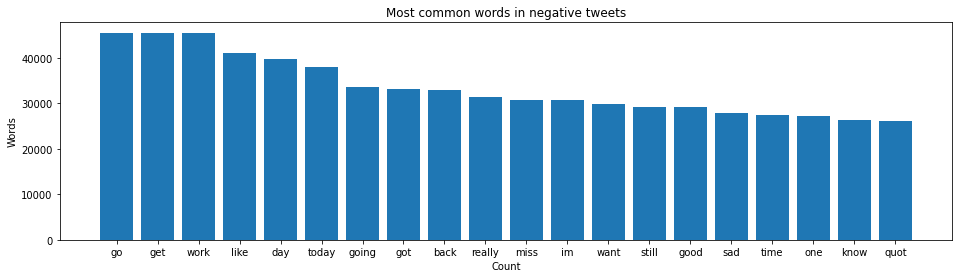

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

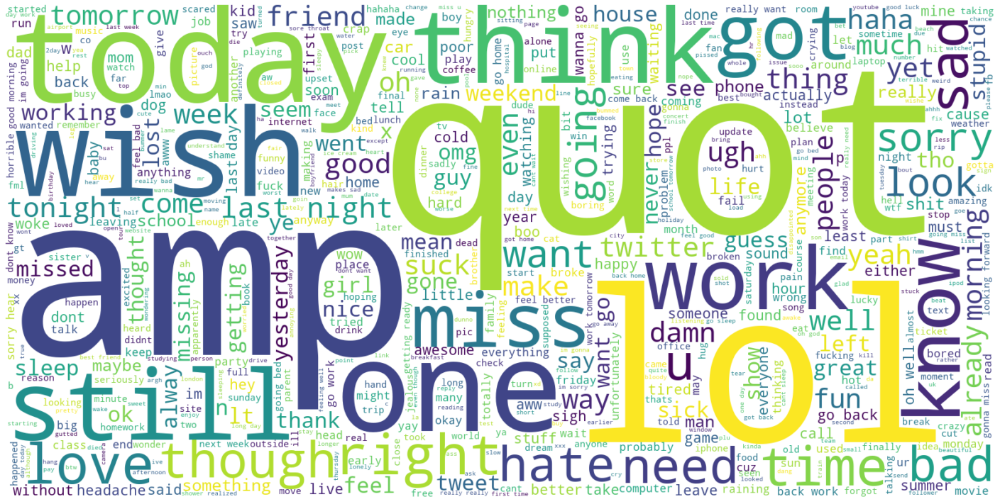

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [28]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [29]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [30]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Using TensorFlow backend.


Vocabulary Size : 290458


In [31]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [32]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [33]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [34]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '000s',
 '0010x0010',
 '00pm',
 '01',
 '02',
 '02am',
 '04',
 '0400',
 '05',
 '06',
 '07',
 '08',
 '09',
 '0f',
 '0n3',
 '0nly',
 '0p',
 '0r',
 '0s',
 '0utside',
 '10',
 '100',
 '1000',
 '10000',
 '1000th',
 '100degrees',
 '100k',
 '101',
 '1013',
 '101fengshuitips',
 '102',
 '103',
 '104',
 '105',
 '106',
 '1080p',
 '109',
 '10am',
 '10k',
 '10min',
 '10mm',
 '10month',
 '10p',
 '10pm',
 '10q',
 '10s',
 '10th',
 '10yr',
 '11',
 '110',
 '1108',
 '110s',
 '111',
 '112',
 '1130',
 '114',
 '116',
 '1170',
 '118',
 '11am',
 '11days',
 '11pm',
 '12',
 '120',
 '1200',
 '120cfn',
 '123',
 '1230',
 '127',
 '127rupees',
 '12am',
 '12h',
 '12months',
 '12mp',
 '12pm',
 '12sec',
 '12seconds',
 '12th',
 '13',
 '130',
 '1300',
 '130am',
 '1315',
 '134',
 '135bc',
 '13hrs',
 '13th',
 '13wildangel',
 '14',
 '140',
 '1408',
 '14240',
 '14279',
 '1443820073',
 '147',
 '14th',
 '15',
 '150',
 '1500',
 '1515',
 '1525',
 '156873582395823678',
 '15a',
 '15am',
 '15day',
 '15mins',
 '15p',
 

In [36]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [37]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

believe missed u
[0 0 0 ... 0 0 0]
finished breaking dawn im hard time dealing fact lol im pathetic
[0 0 0 ... 0 0 0]
awwww take good care
[0 0 0 ... 0 0 0]
ew believe following rpattinson thespencer smith thisisryan ross brendonuriesays amazondotjon
[0 0 0 ... 0 0 0]
know someone said would happen 6months ago everyone would laughed would like see jenson win
[0 0 0 ... 0 0 0]
whoops second officer die
[0 0 0 ... 0 0 0]
got bed goodbye weekend good hello responsable
[0 0 0 ... 0 0 0]
feeling well hopefully 3 30 comes soon go home bed
[0 0 0 ... 0 0 0]
granny grandpa picked school always good j2o wheatsheaf home homework
[0 0 0 ... 0 0 0]
miserable rainy monday
[0 0 0 ... 0 0 0]
lol oh bj wanted detox much alcohol caffeine
[0 0 0 ... 0 0 0]
click never fails make cry
[0 0 0 ... 0 0 0]
quot count far near side quot missing far
[0 0 0 ... 0 0 0]
understand twitter atm gonna type kinds see happens new trend
[0 0 0 ... 0 0 0]
im confuzzled 101
[0 0 0 ... 0 0 0]
olawd go see priceless soooo f

[0 0 0 ... 0 0 0]
god followers falling minute wrongg ahahaa
[0 0 0 ... 0 0 0]
news air crash hitting us hard daughter atc flown half dozen times tutor benson poor kid shock news
[0 0 0 ... 0 0 0]
meeting person want meet time morning ruin day office
[0 0 0 ... 0 0 0]
really nadhiyamali n r chennai n hiyer viveksingh r mumbai
[0 0 0 ... 0 0 0]
long one
[0 0 0 ... 0 0 0]
english exam
[0 0 0 ... 0 0 0]
wanna go friend house
[0 0 0 ... 0 0 0]
hiiyah wats everyone doin talk 2 im bored no1 bebo picture wont go lol mayb cause ugly haha oj x
[0 0 0 ... 0 0 0]
best coffee morning begin work nespresso roma
[0 0 0 ... 0 0 0]
last night sooo much fun minus retarded unnecessary hour long walk alex took ahah
[0 0 0 ... 0 0 0]
ready
[0 0 0 ... 0 0 0]
tuesday hot outside work soon
[0 0 0 ... 0 0 0]
hates see love go
[0 0 0 ... 0 0 0]
look weekend cuz come well weekend least
[0 0 0 ... 0 0 0]
say maybe apply job guardian lol great compliment artist really respect
[0 0 0 ... 0 0 0]
thanks though sadly 

[0 0 0 ... 0 0 0]
saying interesting person world bots spam awesomely cool ppl like urself follow
[0 0 0 ... 0 0 0]
message today letting go wow jakes
[0 0 0 ... 0 0 0]
get 100 followers day using www tweeterfollow com add everyone train pay vip
[0 0 0 ... 0 0 0]
tiesto glowsticks feel pacheco
[0 0 0 ... 0 0 0]
grocery store last dish sponge disentegrated hands
[0 0 0 ... 0 0 0]
make long day short nothing well friends left 3 55am drinking since 9 smashed
[0 0 0 ... 0 0 0]
nick really really love
[0 0 0 ... 0 0 0]
thanks followfriday
[0 0 0 ... 0 0 0]
still 6 months old puppy hyper fun feeling going happy hand back
[0 0 0 ... 0 0 0]
okay hans molly conally ruined fucking life
[0 0 0 ... 0 0 0]
didnt finish song within week happen
[0 0 0 ... 0 0 0]
today lines vines trying times still one buy jeje
[0 0 0 ... 0 0 0]
got new desk today got hutch laptop open properly
[0 0 0 ... 0 0 0]
seen trailer
[0 0 0 ... 0 0 0]
busy schoolstuff trying gratuade enjoying good weather
[0 0 0 ... 0 0 0]
no

wish luck good design drawing lol serious
[0 0 0 ... 0 0 0]
much handle today
[0 0 0 ... 0 0 0]
bed
[0 0 0 ... 0 0 0]
nice see sunshine morning mistook paint thrown neighbour house relieved find light
[0 0 0 ... 0 0 0]
awl to0 bad live so0o0o0 far apart skateboardbee
[0 0 0 ... 0 0 0]
watching apprentice obviously think kate bag
[0 0 0 ... 0 0 0]
guess
[0 0 0 ... 0 0 0]
great thanks letting us know
[0 0 0 ... 0 0 0]
damn man today niiiiice
[0 0 0 ... 0 0 0]
chinese world
[0 0 0 ... 0 0 0]
therefore come thursday vue
[0 0 0 ... 0 0 0]
24 pushed l sportscaster bill keene used say call em see em fourstringfuror jen niffer nascar
[0 0 0 ... 0 0 0]
hey birthday robybday jossbday
[0 0 0 ... 0 0 0]
rain afternoon engagement shoot hate mercy weather need covered garden
[0 0 0 ... 0 0 0]
taking look future piano lessons scaring many notes enough fingers
[0 0 0 ... 0 0 0]
gah thinking mafia wars works sigh
[0 0 0 ... 0 0 0]
lt 3 culture club
[0 0 0 ... 0 0 0]
trying keep eyes open damn baking
[0

[0 0 0 ... 0 0 0]
bad get hang pleasure mine
[0 0 0 ... 0 0 0]
nnnnneeeeeed loose w8
[0 0 0 ... 0 0 0]
working 33 mins get go home
[0 0 0 ... 0 0 0]
jimmy yummmmmm blue moon shaje
[0 0 0 ... 0 0 0]
awesome hear glad spreading around ted leo love
[0 0 0 ... 0 0 0]
single rose garden single friend world quot said great time hope sun shines
[0 0 0 ... 0 0 0]
back work run gym hours nap nothing like pulling double shift bug watch
[0 0 0 ... 0 0 0]
gonna boring
[0 0 0 ... 0 0 0]
give rain fob fiddy show got cancelled weather
[0 0 0 ... 0 0 0]
dump pump day green line park n ride norwalk full 630am
[0 0 0 ... 0 0 0]
n bad night made work time need time
[0 0 0 ... 0 0 0]
blessed forgetful brendon spencer fic really well written even hopeful ending
[0 0 0 ... 0 0 0]
itsc09 bris evening event tomorrow night sounds like place mention workshops pitty adel
[0 0 0 ... 0 0 0]
sleep maybe bought prius
[0 0 0 ... 0 0 0]
tough time life need want remember
[0 0 0 ... 0 0 0]
hola darling thank much yes m

summer boring
[0 0 0 ... 0 0 0]
sitting home hopin maybe drink beer
[0 0 0 ... 0 0 0]
yeah thek2
[0 0 0 ... 0 0 0]
geography revision boring
[0 0 0 ... 0 0 0]
star wars day know thing may force lt 3
[0 0 0 ... 0 0 0]
heartbreaking wish could help
[0 0 0 ... 0 0 0]
kittie fan room
[0 0 0 ... 0 0 0]
happy mothers day mothers male female lol
[0 0 0 ... 0 0 0]
itchy peeling tan vanishing sunburn pain nothing
[0 0 0 ... 0 0 0]
cutting tshirts
[0 0 0 ... 0 0 0]
thats good worker log get real work done playing u missed see u later
[0 0 0 ... 0 0 0]
oops mean going movies andrew
[0 0 0 ... 0 0 0]
yay glasses arrived eastgardens toes much pain able go get
[0 0 0 ... 0 0 0]
think add last fm
[0 0 0 ... 0 0 0]
susan boyle win like adam
[0 0 0 ... 0 0 0]
much twittering
[0 0 0 ... 0 0 0]
know porcupine tree around since 1990 right
[0 0 0 ... 0 0 0]
twilight book awesome buy new moon finished books interested hope ok
[0 0 0 ... 0 0 0]
fun tonight cody sam austin bobby amp katie
[0 0 0 ... 0 0 0]
do

[0 0 0 ... 0 0 0]
thinking stevie wonder called say love
[0 0 0 ... 0 0 0]
sorry missed u capitol day spent day walking house senate must walked u 10 times
[0 0 0 ... 0 0 0]
awwwww startin 2 het nervous
[0 0 0 ... 0 0 0]
wash funny
[0 0 0 ... 0 0 0]
timtfj ms mogensen knows spots good thing
[0 0 0 ... 0 0 0]
hummingbird smoothie robeks yum
[0 0 0 ... 0 0 0]
good news fracture clinic today shoulder immobiliser gone collar cuff could back bike 2 3 wks
[0 0 0 ... 0 0 0]
dd fever back looks like swimming lessons tomorrow either
[0 0 0 ... 0 0 0]
noisy wake suzy
[0 0 0 ... 0 0 0]
owns sims 3
[0 0 0 ... 0 0 0]
pride amp joy cd release party gone well band cocktail waitresses
[0 0 0 ... 0 0 0]
another fish died sad sad day think murdered
[0 0 0 ... 0 0 0]
tell 1 month til bday extravaganza
[0 0 0 ... 0 0 0]
assignment work college
[0 0 0 ... 0 0 0]
tragic worse told shall rain next days
[0 0 0 ... 0 0 0]
really wanted like defiance
[0 0 0 ... 0 0 0]
whatleydude movie would please outside indi

burned hand
[0 0 0 ... 0 0 0]
yunhoo concert always great tvxq always give best performance stage tvxq come malaysia
[0 0 0 ... 0 0 0]
ecu plex gone
[0 0 0 ... 0 0 0]
aww still looked really pretty
[0 0 0 ... 0 0 0]
hey anthony shuddup leave lakers alone
[0 0 0 ... 0 0 0]
blockh3d blocked today available good download stores
[0 0 0 ... 0 0 0]
apparently swimming coaches relay pray
[0 0 0 ... 0 0 0]
stomach stupid permanent gas pain thing seem developed would go away would totally awesome
[0 0 0 ... 0 0 0]
offended think dumb enough besides bmw lesa people
[0 0 0 ... 0 0 0]
unfortunately class presidents one would save case prof lashes lack photocopies
[0 0 0 ... 0 0 0]
dont feel good hmm sadly single choices make shouldve made better ones
[0 0 0 ... 0 0 0]
think consider skateboarding
[0 0 0 ... 0 0 0]
btw tweeted saw yer super mean tweet
[0 0 0 ... 0 0 0]
theres consolidated packing list trip india check reorganization done
[0 0 0 ... 0 0 0]
keen tonight
[0 0 0 ... 0 0 0]
oh minus try

[0 0 0 ... 0 0 0]
apt spotless n im twittering dang shits like crack cocaine wanna fuck jason im angry
[0 0 0 ... 0 0 0]
asked jeff sell give preston help morning got word
[0 0 0 ... 0 0 0]
hiding
[0 0 0 ... 0 0 0]
saw bawled fucking eyes
[0 0 0 ... 0 0 0]
planned outfit tomorrows bbc londonfashionweek meeting lovely stuff meeting designer julian roberts
[0 0 0 ... 0 0 0]
listing music init
[0 0 0 ... 0 0 0]
delicious prefer black licorice though
[0 0 0 ... 0 0 0]
take walk wild side
[0 0 0 ... 0 0 0]
sure whenever make
[0 0 0 ... 0 0 0]
alarm set 5 hours 56 minutes mooi
[0 0 0 ... 0 0 0]
mickrogers lancearmstrong spokesmen fully understand yesterdays go slow cars everywhere never happened go cav
[0 0 0 ... 0 0 0]
watching jimmyfallon hilarious yumminess
[0 0 0 ... 0 0 0]
burned roof mouth hot pizza ouchie
[0 0 0 ... 0 0 0]
see want turn
[0 0 0 ... 0 0 0]
city way mall
[0 0 0 ... 0 0 0]
bored chilling upstairs work pah bad times
[0 0 0 ... 0 0 0]
pray mileycyrus hope get mileeyyy
[0 0 

[0 0 0 ... 0 0 0]
enjoying sun daddy learning englisch exam watching gilmore girls
[0 0 0 ... 0 0 0]
whose babes u comment
[0 0 0 ... 0 0 0]
go work tomorrow
[0 0 0 ... 0 0 0]
ugh stupid laptop frickin broken sooo impressed
[0 0 0 ... 0 0 0]
jus got done w shower gettin ready day church w loves
[0 0 0 ... 0 0 0]
aye fresh ohk looc 1 mah niqqaz jumped tha pool w iphone poccet lmao yu said anything
[0 0 0 ... 0 0 0]
love replace amp companies said install windows big anymore would break 3
[0 0 0 ... 0 0 0]
feel like crap friend u haha good dani saved day lmao amp good lord know u get ur
[0 0 0 ... 0 0 0]
eating lot sweets know bad swine flu coming anyway lol
[0 0 0 ... 0 0 0]
taxes best mood
[0 0 0 ... 0 0 0]
back shepval good home
[0 0 0 ... 0 0 0]
rain like storm even better
[0 0 0 ... 0 0 0]
aggghhhh ate whole slice mouldy toast
[0 0 0 ... 0 0 0]
hehe fun
[0 0 0 ... 0 0 0]
booze bag ahahahah way nasty nate
[0 0 0 ... 0 0 0]
hi nice meet interesting camp believe survived rain
[0 0 0 ..

oh def go tunes listen purchase usually love stuff
[0 0 0 ... 0 0 0]
miss ed mcmanoh r p sir
[0 0 0 ... 0 0 0]
issue developer site
[0 0 0 ... 0 0 0]
good looking edward always 1
[0 0 0 ... 0 0 0]
contacting claire get phone
[0 0 0 ... 0 0 0]
thanks lot good happened know good done
[0 0 0 ... 0 0 0]
wats moxie honestly dunno im new fan tmr ate delle gud thing panghapon ako sa skul stil listen
[0 0 0 ... 0 0 0]
guess wireless internet bill 127rupees less 3 dollars
[0 0 0 ... 0 0 0]
anymore
[0 0 0 ... 0 0 0]
wondering anyone ever going follow
[0 0 0 ... 0 0 0]
aw yay thanks replying coming new zealand tooo
[0 0 0 ... 0 0 0]
ahhh awesome sadly regretting could totally use desk topper four
[0 0 0 ... 0 0 0]
hey hey hey b
[0 0 0 ... 0 0 0]
said like amp outta nowhere laaaame
[0 0 0 ... 0 0 0]
got work bbl osu grfeat day
[0 0 0 ... 0 0 0]
hmmm think set white balance gig even though shooting raw forget change wb videos
[0 0 0 ... 0 0 0]
send best worst brussels
[0 0 0 ... 0 0 0]
tried fix gi

[0 0 0 ... 0 0 0]
congrats mique fantastic hard fought game btwn two talented teams
[0 0 0 ... 0 0 0]
listening music looking new game play
[0 0 0 ... 0 0 0]
cba interview today bloody cold pissing
[0 0 0 ... 0 0 0]
martinpolley btw official cellcom account confirmed tweeting fyi
[0 0 0 ... 0 0 0]
going gym leg day booooo
[0 0 0 ... 0 0 0]
breakfast bed cereal nice cup tea fresh fruits side
[0 0 0 ... 0 0 0]
champion fumbler words know
[0 0 0 ... 0 0 0]
im workin beat right fuck ears til deaf trust
[0 0 0 ... 0 0 0]
zendesk 5 000 business free plan take good look www zendesk com signup
[0 1 0 ... 0 0 0]
pas soucis garden near
[0 0 0 ... 0 0 0]
photo finished final photo parts came weird overall success jamie watching
[0 0 0 ... 0 0 0]
everyone follow lighterloser shit funny
[0 0 0 ... 0 0 0]
would like write expono invites left give away expono
[0 0 0 ... 0 0 0]
thank rt
[0 0 0 ... 0 0 0]
shower time
[0 0 0 ... 0 0 0]
brudder gonna manila hope come
[0 0 0 ... 0 0 0]
feel sad travel see

back still hoping taylor wil also accept request pls
[0 0 0 ... 0 0 0]
bought box jelly belly love peanut butter root beer hate licorice flavor
[0 0 0 ... 0 0 0]
u liking buffalo far
[0 0 0 ... 0 0 0]
emilyosment great picture miley emliy lt 3 much love xoxox loove u lt 33
[0 0 0 ... 0 0 0]
sooo ready laker game come definitely takin game 7 let go lakers lol
[0 0 0 ... 0 0 0]
concert going tonight damn jonas boys canceled tourdate
[0 0 0 ... 0 0 0]
hehe x eah later lt 3
[0 0 0 ... 0 0 0]
find anyone know twitter
[0 0 0 ... 0 0 0]
see lol well wish raining got lawn quot yes dear stop playing twitterers quot
[0 0 0 ... 0 0 0]
home today well
[0 0 0 ... 0 0 0]
wonderful day coming end
[0 0 0 ... 0 0 0]
funny videos movie buffs good laugh
[0 0 0 ... 0 0 0]
p bella edward also meadow kind kissing x sweet
[0 0 0 ... 0 0 0]
srry im late damn srry hear ur homies house gettn brokn hope works tho
[0 0 0 ... 0 0 0]
true got good academy arsene bringing
[0 0 0 ... 0 0 0]
noticed friends either wif

think weather hun always tired month x
[0 0 0 ... 0 0 0]
dark forest gonee
[0 0 0 ... 0 0 0]
happy mother day lovely hope amazing day sending big hugs amp lots love lt 3
[0 0 0 ... 0 0 0]
studying finals excited summer going amazing
[0 0 0 ... 0 0 0]
oh yes think artists alchemist
[0 0 0 ... 0 0 0]
happy fridays 3 day weekends summer
[0 0 0 ... 0 0 0]
last day ecija back home tomorrow night
[0 0 0 ... 0 0 0]
class wishing still bed cold raining
[0 0 0 ... 0 0 0]
awwwwwww puppy face
[0 0 0 ... 0 0 0]
watching conan first tonight show
[0 0 0 ... 0 0 0]
tuesday without playing soccer knee still hurts
[0 0 0 ... 0 0 0]
good day state mind tell alternatively could go park
[0 0 0 ... 0 0 0]
going see new episode jonas
[0 0 0 ... 0 0 0]
fun
[0 0 0 ... 0 0 0]
yep still always enjoy talks maybe thats cos agree lets feel vaguely clever
[0 0 0 ... 0 0 0]
going sew already 11 im sleeepy going read 1984 close eyes think tomorrow make stuff
[0 0 0 ... 0 0 0]
color wheel missing design settings chang

[0 0 0 ... 0 0 0]
think getting cold
[0 0 0 ... 0 0 0]
says thanks
[0 0 0 ... 0 0 0]
miss boyfriend even though finished talking
[0 0 0 ... 0 0 0]
indeed excellent movie
[0 0 0 ... 0 0 0]
get da auditioning room im gunna turn camcorder listen audition
[0 0 0 ... 0 0 0]
jump let get krazyyy party mood bad grounded
[0 0 0 ... 0 0 0]
thank
[0 0 0 ... 0 0 0]
woke half hour ago waiting mom start nagging trust happen slowest week ever ah tuesday
[0 0 0 ... 0 0 0]
nice afternoon nap gotta get ready quick get lil rascal school go play station
[0 0 0 ... 0 0 0]
aww cute love bathroom
[0 0 0 ... 0 0 0]
nope seems ship nitrous oxide
[0 0 0 ... 0 0 0]
iscreamlover verseofserenity wtf twitter updating come get program
[0 0 0 ... 0 0 0]
miss long happiness wish weekend never end like used
[0 0 0 ... 0 0 0]
lo0o anything
[0 0 0 ... 0 0 0]
wishing still job im feeling alittle sorry 4
[0 0 0 ... 0 0 0]
finally started talking someone dx class
[0 0 0 ... 0 0 0]
stroke techinque cuprit behind constant st

[0 0 0 ... 0 0 0]
blv minutes ago haya finished b sc last exam
[0 0 0 ... 0 0 0]
rebekah gibney gold logie
[0 0 0 ... 0 0 0]
havig korea food sighhh woke late today waste slot time morning
[0 0 0 ... 0 0 0]
quot joellen started crying went hill quot kaitlyn hypothetically
[0 0 0 ... 0 0 0]
lucky guys hope great night
[0 0 0 ... 0 0 0]
far good week def looking forward weekend
[0 0 0 ... 0 0 0]
care sun shine care nothing mine loving winter
[0 0 0 ... 0 0 0]
hey fav riesling especially late harvest riesling miss corks
[0 0 0 ... 0 0 0]
macbook charging chord stopped working use iphone mail surf get replacement stupid apple support
[0 0 0 ... 0 0 0]
needs serious debugging guess mondaymorning sundayevening pretty hardcore
[0 0 0 ... 0 0 0]
much freaking fun roller derby practice yesterday cant wait till skates
[0 0 0 ... 0 0 0]
testing source parameter twunami thinks something else seem appearing el
[0 0 0 ... 0 0 0]
forces2 imtrailblazer thanks ff recommend
[0 0 0 ... 0 0 0]
sometimes c

[0 0 0 ... 0 0 0]
yum cheated fed kids eggos
[0 0 0 ... 0 0 0]
crap direct identica laconica login broken latest adium adium 1 4 svn switching xmpp
[0 0 0 ... 0 0 0]
topsr back bypass drive carefully drink water
[0 0 0 ... 0 0 0]
go tomorrow
[0 0 0 ... 0 0 0]
haha good song im excited
[0 0 0 ... 0 0 0]
lillij joannerk danmillerbbnq divachampion stacykinney diannawhitley thank followfriday love
[0 0 0 ... 0 0 0]
teeth feeling better already hurt much time morning ice cream nyet iet d8 lt brush teeth gt
[0 0 0 ... 0 0 0]
wanna see wolverine also jason
[0 0 0 ... 0 0 0]
omg saw got hacked sorry
[0 0 0 ... 0 0 0]
basti thing loading slowly hope combine end
[0 0 0 ... 0 0 0]
death metal
[0 0 0 ... 0 0 0]
know sad sight
[0 0 0 ... 0 0 0]
way nashville yay
[0 0 0 ... 0 0 0]
girl drama sucks soo much
[0 0 0 ... 0 0 0]
pizza tonight yessir
[0 0 0 ... 0 0 0]
greetings austria fell love music weeks ago looks like gonna life long love
[0 0 0 ... 0 0 0]
today concrete plans nice
[0 0 0 ... 0 0 0]
e

know back sooner later
[0 0 0 ... 0 0 0]
oh get started sista still dealing right moment matter fact
[0 0 0 ... 0 0 0]
easier said done im 6ft weigh 10 n half stone used weigh 11
[0 0 0 ... 0 0 0]
1st year really bad movie picking theo work lil amp chillllllin miss brit amp manda already
[0 0 0 ... 0 0 0]
people feel lonely without gf bf build walls instead bridges amp never change infatuation well love
[0 0 0 ... 0 0 0]
soooo sleepy yet much need get done
[0 0 0 ... 0 0 0]
hiding loggers attcking rufus ovest child oak
[0 0 0 ... 0 0 0]
ok well nearly kickoff time newcastle shearer knows c mon toon
[0 0 0 ... 0 0 0]
probably go bed soon apparently actually school work day
[0 0 0 ... 0 0 0]
fine bb stabs mom lol ily good flight
[0 0 0 ... 0 0 0]
djing grow wana famous x
[0 0 0 ... 0 0 0]
home working german diorama later lounging pool study finals think
[0 0 0 ... 0 0 0]
hands ran away sadfaceee
[0 0 0 ... 0 0 0]
believe already lost turtle necklace
[0 0 0 ... 0 0 0]
guys shame get new 

[0 0 0 ... 0 0 0]
staying late watch end tigers game cannot believe leyland ejected standing magglio strikeout
[0 0 0 ... 0 0 0]
nice massage btw watched happens vegas laughed hard thx
[0 0 0 ... 0 0 0]
going panahra dinner miss guys
[0 0 0 ... 0 0 0]
aww dont ice cream boo u suck
[0 0 0 ... 0 0 0]
really need scratch back still sore
[0 0 0 ... 0 0 0]
think wisdom teeth r coming bc mouth much pain sad story
[0 0 0 ... 0 0 0]
would thing leave
[0 0 0 ... 0 0 0]
use tweetdeck mb use tweetie iphone get stuck api apps work
[0 0 0 ... 0 0 0]
envy coast anberlin taking back sunday concert baltimore sold serious sad face
[0 0 0 ... 0 0 0]
watching great
[0 0 0 ... 0 0 0]
thanks making poor time huck gee
[0 0 0 ... 0 0 0]
doclg thetazzone mmangen bradgal ur welcome amp pleasure
[0 0 0 ... 0 0 0]
today start using twitter ment example wearing plum underwear today
[0 0 0 ... 0 0 0]
read cinderella xoxo
[0 0 0 ... 0 0 0]
im sorry seem sad love feel better im sick better lt 3333333333
[0 0 0 ... 0

[0 0 0 ... 0 0 0]
never sonic good always see commercials idk one socal
[0 0 0 ... 0 0 0]
weekend end soon
[0 0 0 ... 0 0 0]
weather shite weekend
[0 0 0 ... 0 0 0]
aww ur cute
[0 0 0 ... 0 0 0]
mall jaybee kulak nd love
[0 0 0 ... 0 0 0]
morning everyone time study exam tomorrow huhu guess today gonna boring day
[0 0 0 ... 0 0 0]
thank much
[0 0 0 ... 0 0 0]
hard one wants make compromise video pretty awesome
[0 0 0 ... 0 0 0]
please follow jonagossip
[0 0 0 ... 0 0 0]
cramp
[0 0 0 ... 0 0 0]
feel another migraine coming
[0 0 0 ... 0 0 0]
keep checking make sure dog still alive sadly actually serious
[0 0 0 ... 0 0 0]
preparing 24 hour run ride row yey
[0 0 0 ... 0 0 0]
ex boyfriend fucks 17 year old boys look like pre op trannies
[0 0 0 ... 0 0 0]
awww miss joey seeing crazy youtube video made 2 soo funni follow x
[0 0 0 ... 0 0 0]
angry happiness
[0 0 0 ... 0 0 0]
yes sorry havent slept week sort
[0 0 0 ... 0 0 0]
going sneaky sunbed get nails done take little molly molls lovely wal

finished writing list includes ironing cleaning car
[0 0 0 ... 0 0 0]
vou indo seb day
[0 0 0 ... 0 0 0]
neither much laughing acctually regular jawaches like right bellie auch lol xx
[0 0 0 ... 0 0 0]
yessss blinds getting installed evening longer see weird neighbor house
[0 0 0 ... 0 0 0]
yah def miss one someone else trak
[0 0 0 ... 0 0 0]
happy mother day mother day october argentina though
[0 0 0 ... 0 0 0]
cut finger hurts ouchhhhh
[0 0 0 ... 0 0 0]
ha ok cool doctor great
[0 0 0 ... 0 0 0]
hahaha yep exactly doubt worries would ready today think show
[0 0 0 ... 0 0 0]
schultz guy dead think deliver mail graves really dead
[0 0 0 ... 0 0 0]
hey generated great discussion round table good job
[0 0 0 ... 0 0 0]
yayayayay hopefully problems extracting whatever gt gt
[0 0 0 ... 0 0 0]
home safe sick beggining hate flying get early tomorrow set cad wash wedding yay
[0 0 0 ... 0 0 0]
oh yes think celebrating mates tonight lol drink
[0 0 0 ... 0 0 0]
eddievansell 2 0 baby ouch must hurt

[0 0 0 ... 0 0 0]
hlf keybord dont work sooo nnoying cnt red cn u
[0 0 0 ... 0 0 0]
using dell3007wfp like
[0 0 0 ... 0 0 0]
give babe sorry
[0 0 0 ... 0 0 0]
working tiffanypink pictures waiting yard salers get want get rid stuff
[0 0 0 ... 0 0 0]
wah wah wah gerrard way k sorry probably one ugly baby
[0 0 0 ... 0 0 0]
abducted aliens work today thanks zog posting online
[0 0 0 ... 0 0 0]
nothing today ab feel frantic though need staple gun
[0 0 0 ... 0 0 0]
following brother footsteps lol parents soo cheesed
[0 0 0 ... 0 0 0]
goodnight
[0 0 0 ... 0 0 0]
hey today know prob wrapped vocals day support stay strong
[0 0 0 ... 0 0 0]
sooo lucky mom believe fast time going baby going shool september
[0 0 0 ... 0 0 0]
bad rec 528 cut lakes get work time think life flight
[0 0 0 ... 0 0 0]
matinee really fun last night
[0 0 0 ... 0 0 0]
oh sorry hear continue stay positive sure everything alright sending good energy
[0 0 0 ... 0 0 0]
ah jeez way dream ppl messing rite seems subconcious isnt 

like spreading germs job god please let catch anything lady real bad ya move could
[0 0 0 ... 0 0 0]
wow rugrats ages miss old cartoons
[0 0 0 ... 0 0 0]
buongiorno twitter hope finds smiling pretty ticketyboo getting right life looks quite nice
[0 0 0 ... 0 0 0]
last day school
[0 0 0 ... 0 0 0]
successful photshoot today lovely sunny pictures resevoir
[0 0 0 ... 0 0 0]
sick gotta go dr 3
[0 0 0 ... 0 0 0]
exams ugh
[0 0 0 ... 0 0 0]
sunshine wall wall grey added rain wanna share sunshine
[0 0 0 ... 0 0 0]
love song sure vid good
[0 0 0 ... 0 0 0]
last day 7 day work week leave 3 daaaays gonna miss everyone especially sisters
[0 0 0 ... 0 0 0]
going bed soon 5 30 wake call stupid homework school oh well guess gotta work hard get good grades
[0 0 0 ... 0 0 0]
today going concert yay excited
[0 0 0 ... 0 0 0]
first sunburn today walking around outside comes summer
[0 0 0 ... 0 0 0]
know watch intervention sad
[0 0 0 ... 0 0 0]
ok know saturday fyi making sure follow hashtag twitter leas

[0 0 0 ... 0 0 0]
tired lt 3 12 hour shift tommorrow least time catch jorge football game
[0 0 0 ... 0 0 0]
day 2 deloitte orientation
[0 0 0 ... 0 0 0]
morning rota read mails dealing one set mood day
[0 0 0 ... 0 0 0]
man glad baby yet
[0 0 0 ... 0 0 0]
school ends week last year elemantary
[0 0 0 ... 0 0 0]
watched pinks new video going nightmares
[0 0 0 ... 0 0 0]
sorry everybody apparently twitter sending updates
[0 0 0 ... 0 0 0]
enjoy take easy
[0 0 0 ... 0 0 0]
12 24 im already hungry
[0 0 0 ... 0 0 0]
go girl made even full moon always use excuse moods
[0 0 0 ... 0 0 0]
aww maan didnt watch penguins game forgot well fun time tonight going sleep
[0 0 0 ... 0 0 0]
n girl wears pink even though pair pink chucks love wanted watching quot 13 going 30 quot
[0 0 0 ... 0 0 0]
finished playing medal honor ageekinthepink baconbitz good times wish kart play though
[0 0 0 ... 0 0 0]
back morning tandem mr b finished couple hours pool summer officially
[0 0 0 ... 0 0 0]
going help understa

[0 0 0 ... 0 0 0]
well bummer
[0 0 0 ... 0 0 0]
found awesome colleague left friday even say bye damn know leaving
[0 0 0 ... 0 0 0]
lovely sunny morning skirt sandals great coffe good mood
[0 0 0 ... 0 0 0]
cant wait go buy tuesday
[0 0 0 ... 0 0 0]
ebert tf review cue male choir singing music hell kid bang pots n pans together use imagination quot
[0 0 0 ... 0 0 0]
never mind link work post nobody pass u twitter get link 2 work
[0 0 0 ... 0 0 0]
thx l check computer later usually tweet amp fb ipod
[0 0 0 ... 0 0 0]
like socks
[0 0 0 ... 0 0 0]
wait get shit weather 11days go oh yea good luck mates exams next week university
[0 0 0 ... 0 0 0]
waiting babybear get fresh fruit
[0 0 0 ... 0 0 0]
ugh new tires car glad driving
[0 0 0 ... 0 0 0]
dear ock tshirt wearing often would like last weeks
[0 0 0 ... 0 0 0]
c c da case swing tunes way ima ona downloadin spree thanks lol
[0 0 0 ... 0 0 0]
way hampton court sun bliss v excited never
[0 0 0 ... 0 0 0]
goodnight sf
[0 0 0 ... 0 0 0]
enj

[0 0 0 ... 0 0 0]
first thought morning sorry gone
[0 0 0 ... 0 0 0]
trying live stream video dog via ustream day time get work broadcast offline mypupsadie
[0 0 0 ... 0 0 0]
goodsex get itus
[0 0 0 ... 0 0 0]
still missing fudge cat like crazy
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
waited hour seated hour get food food cold tres agaves resturant
[0 0 0 ... 0 0 0]
still wait least know long lol read spoilers impatient bad lol
[0 0 0 ... 0 0 0]
glennedley rowsell ugh spoke soon get settings though
[0 0 0 ... 0 0 0]
wedding singer adam sandler hilarious
[0 0 0 ... 0 0 0]
oh well maybe true would explain emo posts
[0 0 0 ... 0 0 0]
2 every body nice meet
[0 0 0 ... 0 0 0]
publish excruciating details wait
[0 0 0 ... 0 0 0]
hills lc last episode jealous length hair
[0 0 0 ... 0 0 0]
hope 4 lesson learned consolation learned something
[0 0 0 ... 0 0 0]
grandma red beta fish named redwing detroit
[0 0 0 ... 0 0 0]
mine
[0 0 0 ... 0 0 0]
tonight one nights
[0 0 0 ... 0 0 0]
love u
[0 0 0 

[0 0 0 ... 0 0 0]
wish bike
[0 0 0 ... 0 0 0]
wiltingdaisies last day school
[0 0 0 ... 0 0 0]
congrats website link working
[0 0 0 ... 0 0 0]
cant believe oceanus body shop take shelves
[0 0 0 ... 0 0 0]
aw thank sweetie
[0 0 0 ... 0 0 0]
thanks audio rush transferring us
[0 0 0 ... 0 0 0]
another team goal saved skyblue
[0 0 0 ... 0 0 0]
wishies could proper phone back
[0 0 0 ... 0 0 0]
momma misses
[0 0 0 ... 0 0 0]
poor little toes blisters
[0 0 0 ... 0 0 0]
last night calgary dinner drinks tonight
[0 0 0 ... 0 0 0]
time lunch welcome break maths
[0 0 0 ... 0 0 0]
wheres motherfuckin comp tix love jolz
[0 0 0 ... 0 0 0]
going alone haha
[0 0 0 ... 0 0 0]
mmm need coffee
[0 0 0 ... 0 0 0]
would done thing cool party
[0 0 0 ... 0 0 0]
ugh 12 physical therapy right work
[0 0 0 ... 0 0 0]
btw short notice know rsvping party thanks much invitation though 2nite
[0 0 0 ... 0 0 0]
downloading pilot episode glee
[0 0 0 ... 0 0 0]
pants keep falling
[0 0 0 ... 0 0 0]
god bed sounds nice righ

[0 0 0 ... 0 0 0]
hmm link open mobile phone bad
[0 0 0 ... 0 0 0]
sleep tight pleasant dreams
[0 0 0 ... 0 0 0]
yep say hello dreamland g nighty night
[0 0 0 ... 0 0 0]
back home church fter 2 years still miss coffee chunter ali
[0 0 0 ... 0 0 0]
looking forward chemistry physics exams week
[0 0 0 ... 0 0 0]
pleasure
[0 0 0 ... 0 0 0]
watching katt williams pimpin pimpin agaaaaaaaaaain haha love motherfucker yes katt im real motherfucker p
[0 0 0 ... 0 0 0]
wrong tell e2 fine please
[0 0 0 ... 0 0 0]
40 pages go still problems storyline though
[0 0 0 ... 0 0 0]
lost cellphone yesterday
[0 0 0 ... 0 0 0]
lol missed u last night miss mary
[0 0 0 ... 0 0 0]
kerry amazing cant wait till next sunday till watch show xxxx
[0 0 0 ... 0 0 0]
two days later 4 pages translate hooray except still finish french verbs
[0 0 0 ... 0 0 0]
time beddy bye three weeks b rfday
[0 0 0 ... 0 0 0]
drizzling rooftops result hurt legs
[0 0 0 ... 0 0 0]
work feeling illl still come hopefully sleeping help pumpe

dream home far away thoiugh england
[0 0 0 ... 0 0 0]
ohh forum cool although like forums much got msn
[0 0 0 ... 0 0 0]
well lovely dear cleaning garden geting ready plant seeds life jiggleaud must proud
[0 0 0 ... 0 0 0]
arnold wants close state parks ca
[0 0 0 ... 0 0 0]
back work long week ahead seven days straight
[0 0 0 ... 0 0 0]
problem
[0 0 0 ... 0 0 0]
freaked frito sounds like breathe
[0 0 0 ... 0 0 0]
morning germany june run around winter clothes
[0 0 0 ... 0 0 0]
home fun weekend cottage
[0 0 0 ... 0 0 0]
ist sitting next tor mptv trying tor tweet
[0 0 0 ... 0 0 0]
damn hate hospitals aside bad news good news heart boyfriend effin much
[0 0 0 ... 0 0 0]
get butt twitter f sake guy awake tweeting kiss
[0 0 0 ... 0 0 0]
hey phish nothing phishtube broadcast live gt
[0 0 0 ... 0 0 0]
math homework death ew
[0 0 0 ... 0 0 0]
hey nunu physio cold helping
[0 0 0 ... 0 0 0]
late night movie time lets see shall watch
[0 0 0 ... 0 0 0]
seany wanna come watch play x
[0 0 0 ... 0 0 

[0 0 0 ... 0 0 0]
long weekend need plans tho 4 days classes left till summer vacation lt 3
[0 0 0 ... 0 0 0]
marissacre totally still letting dylan sleep since went bed ber late
[0 0 0 ... 0 0 0]
cheering sidelines
[0 0 0 ... 0 0 0]
ugh like mean ladies even little bit nice boys though well dont mind
[0 0 0 ... 0 0 0]
sleep eat lunch desk
[0 0 0 ... 0 0 0]
live long beach thank oscarmosk helping elude police move bed
[0 0 0 ... 0 0 0]
ive listening music day help get sadness coming uk sniff
[0 0 0 ... 0 0 0]
wait weekend away
[0 0 0 ... 0 0 0]
ugh going fail math amp latin whateverrr summers close lt 3
[0 0 0 ... 0 0 0]
fog jealous tried two days straight shoot golden gate clear sunny past weekend luck
[0 0 0 ... 0 0 0]
think going enjoy first one much wanna see ii
[0 0 0 ... 0 0 0]
maatt havent spoken ages dudeee dont forget bout ur aussie fan lool love ya xx
[0 0 0 ... 0 0 0]
liking wet weather
[0 0 0 ... 0 0 0]
speak equally highly ines love luggage
[0 0 0 ... 0 0 0]
morning ian gr

### tf-idf

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'believe': 2209,
 'missed': 12131,
 'finished': 6981,
 'breaking': 2848,
 'dawn': 5000,
 'im': 9313,
 'hard': 8447,
 'time': 18777,
 'dealing': 5053,
 'fact': 6646,
 'lol': 11136,
 'pathetic': 13754,
 'awwww': 1767,
 'good': 7924,
 'care': 3363,
 'ew': 6483,
 'following': 7172,
 'rpattinson': 15835,
 'thespencer': 18616,
 'smith': 17047,
 'thisisryan': 18652,
 'ross': 15795,
 'brendonuriesays': 2870,
 'amazondotjon': 1109,
 'know': 10435,
 'said': 15977,
 'happen': 8419,
 '6months': 452,
 'ago': 846,
 'laughed': 10692,
 'like': 10954,
 'jenson': 9885,
 'win': 20643,
 'whoops': 20556,
 'second': 16286,
 'officer': 13228,
 'die': 5354,
 'got': 7980,
 'bed': 2147,
 'goodbye': 7925,
 'weekend': 20403,
 'hello': 8673,
 'responsable': 15486,
 'feeling': 6832,
 'hopefully': 8958,
 '30': 249,
 'comes': 4149,
 'soon': 17223,
 'home': 8885,
 'granny': 8051,
 'grandpa': 8046,
 'picked': 14048,
 'school': 16170,
 'j2o': 9729,
 'wheatsheaf': 20507,
 'homework': 8905,
 'miserable': 12118,
 'rainy':

In [39]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

believe missed u
  (0, 12131)	0.672988061036873
  (0, 2209)	0.7396533442781357
finished breaking dawn im hard time dealing fact lol im pathetic
  (0, 18777)	0.18291574630262714
  (0, 13754)	0.3506661827018002
  (0, 11136)	0.18086965849507136
  (0, 9313)	0.38087892960895675
  (0, 8447)	0.2538345960905004
  (0, 6981)	0.27585919485482835
  (0, 6646)	0.3369810566020872
  (0, 5053)	0.36613026869982324
  (0, 5000)	0.3831814647025662
  (0, 2848)	0.36169949828948145
awwww take good care
  (0, 7924)	0.349153102160511
  (0, 3363)	0.6290050306876199
  (0, 1767)	0.6945824519964192
ew believe following rpattinson thespencer smith thisisryan ross brendonuriesays amazondotjon
  (0, 18652)	0.3492936079071451
  (0, 18616)	0.3492936079071451
  (0, 17047)	0.31794764717426094
  (0, 15835)	0.3492936079071451
  (0, 15795)	0.325581303997336
  (0, 7172)	0.2239645442079041
  (0, 6483)	0.2879981914945849
  (0, 2870)	0.3492936079071451
  (0, 2209)	0.2230984315350246
  (0, 1109)	0.3492936079071451
know someone sa

  (0, 20822)	0.15188456644912482
  (0, 20605)	0.36327840693234914
  (0, 20304)	0.27486720066753134
  (0, 18249)	0.21974300240838804
  (0, 14452)	0.2410995914535531
  (0, 13587)	0.28929336002011546
  (0, 12251)	0.21615213020935214
  (0, 11084)	0.2410995914535531
  (0, 10564)	0.348852247579765
  (0, 9973)	0.22135319965828526
  (0, 8079)	0.1712156281975225
  (0, 7944)	0.36327840693234914
  (0, 7720)	0.24735765591408407
  (0, 7435)	0.28510272361902517
yep sure thankies
  (0, 21096)	0.5552002301568468
  (0, 18546)	0.7127214684397183
  (0, 18041)	0.42869664432896587
working wearing sunglasses eyes bleeding
  (0, 20831)	0.3283081339253818
  (0, 20355)	0.4357697403233944
  (0, 17987)	0.5102376182848469
  (0, 6616)	0.4054400481876292
  (0, 2463)	0.5268723211837328
missed sytycd dance event afternoon evening
  (0, 18195)	0.5058186480086584
  (0, 12131)	0.32293481835610416
  (0, 6440)	0.44251575769030665
  (0, 6436)	0.37836907324699054
  (0, 4900)	0.3940257761658611
  (0, 811)	0.3816031115476928


thanks follow friday
  (0, 18549)	0.48207735436139887
  (0, 7357)	0.642137867004856
  (0, 7165)	0.5960372338791999
thank joining twibe know little late reply sorry middle graduation party son
  (0, 19416)	0.40521121615130984
  (0, 18541)	0.22516014642916785
  (0, 17266)	0.21340369141667728
  (0, 17201)	0.3073843574275913
  (0, 15414)	0.28812212123100933
  (0, 13716)	0.25275974000023504
  (0, 12006)	0.33869747164538694
  (0, 11050)	0.2296323231221754
  (0, 10672)	0.2541608000405694
  (0, 10435)	0.1838378980848658
  (0, 10005)	0.37019467219468344
  (0, 8030)	0.3086964458230348
stuck late night traffic 401
  (0, 19110)	0.46611004997944344
  (0, 17810)	0.40774239572475535
  (0, 12886)	0.2883950935564864
  (0, 10672)	0.3767961424888996
  (0, 330)	0.625572135772389
oh fuck poor jon
  (0, 14343)	0.47429575494329224
  (0, 13242)	0.3573665751518714
  (0, 10020)	0.6233377755451807
  (0, 7429)	0.5087068757009092
work miss bed
  (0, 20822)	0.5125056607515374
  (0, 12127)	0.5788260836491064
  (0, 2

  (0, 18967)	0.22835988571180144
  (0, 18636)	0.2087752758422263
  (0, 17167)	0.33974134540004236
  (0, 13887)	0.23774825983148365
  (0, 11730)	0.4559711146787387
  (0, 8985)	0.40690977111836224
  (0, 7898)	0.1884069306554143
  (0, 4012)	0.4559711146787387
  (0, 1938)	0.33974134540004236
still accept cavs lost
  (0, 11227)	0.4278530202159041
  (0, 3479)	0.6299604561746003
  (0, 621)	0.6481447498425168
thibet karageorgakis thank
  (0, 18625)	0.6615811645317753
  (0, 18541)	0.3530166079288058
  (0, 10180)	0.6615811645317753
one week go back india excited back literally counting days
  (0, 20401)	0.3004361072280776
  (0, 11046)	0.4666905447517596
  (0, 9422)	0.49577941749868126
  (0, 6519)	0.354806580865381
  (0, 5013)	0.3078647233614761
  (0, 4502)	0.47483939640871486
think need memory laptop
  (0, 18636)	0.3607776918141939
  (0, 12728)	0.3717156589518895
  (0, 11899)	0.6637463431809159
  (0, 10650)	0.5395439906932027
totally agreed sept straight minus bit
  (0, 19049)	0.3273509233990217

  (0, 18892)	0.21595616091761763
  (0, 12557)	0.5272447951555822
  (0, 5799)	0.49145201643139286
  (0, 4978)	0.3947957751419564
  (0, 1546)	0.5272447951555822
workplace short sleeved shirt absolutely necessary today
  (0, 20841)	0.4529137862099924
  (0, 18892)	0.19318210611794542
  (0, 16961)	0.471643223953843
  (0, 16633)	0.3344324216090958
  (0, 16579)	0.3549735612493222
  (0, 12720)	0.4208956009062157
  (0, 602)	0.34655167690206706
time get fed nagging
  (0, 18777)	0.31636036707225923
  (0, 12601)	0.7131430011054394
  (0, 6816)	0.6255742786594032
feel bad accidentally burning mini bag popcorn lunch created quite stench office
  (0, 17621)	0.3794593873171951
  (0, 14932)	0.24330662457613123
  (0, 14348)	0.31610405582413087
  (0, 13227)	0.255621195442388
  (0, 12083)	0.2871102096038348
  (0, 11339)	0.23520478322065644
  (0, 6830)	0.18264551904190215
  (0, 4613)	0.36439066458330793
  (0, 3114)	0.31610405582413087
  (0, 1865)	0.29780163852977204
  (0, 1854)	0.1920253191415812
  (0, 632)

opening day little league baseball raining cats dogs
  (0, 14999)	0.31336574781922505
  (0, 13364)	0.39347747735183175
  (0, 11050)	0.26219427279002755
  (0, 10759)	0.4490953090337109
  (0, 5594)	0.3731498905745095
  (0, 5005)	0.18780211790887644
  (0, 3459)	0.39347747735183175
  (0, 2002)	0.38367948618680614
must complain physician never gives pregnancy test sticks finger butt
  (0, 18504)	0.2877292732854746
  (0, 17663)	0.34301636571763244
  (0, 14497)	0.39103225439570494
  (0, 14039)	0.4072026923190634
  (0, 7807)	0.3572409930023062
  (0, 6976)	0.3392152807039774
  (0, 4203)	0.3706599119337114
  (0, 3142)	0.3174184579947113
going workout begin reading apush book
  (0, 20839)	0.43748688988694706
  (0, 15124)	0.35525572031646246
  (0, 7898)	0.22521232214421533
  (0, 2643)	0.35839671074869683
  (0, 2182)	0.4540434055850293
  (0, 1384)	0.5450453081012178
going salon 808 hair consultation
  (0, 15999)	0.4878316490975973
  (0, 8333)	0.33667291109374464
  (0, 7898)	0.22587529277175383
  (0

  (0, 18818)	0.20838098808158376
  (0, 13658)	0.2778910988764952
  (0, 12387)	0.371120069484063
  (0, 10691)	0.26315353903491573
  (0, 8275)	0.7714600100174435
  (0, 5257)	0.2778910988764952
boooo miss uuuu weeks til twicon though
  (0, 20412)	0.32774834621990295
  (0, 19867)	0.5207491479526039
  (0, 19418)	0.5207491479526039
  (0, 18764)	0.34319934382978
  (0, 12127)	0.2458963353115331
  (0, 2658)	0.41469371111527525
worst headache
  (0, 20859)	0.73417892363464
  (0, 8560)	0.6789560428265452
finished photo shoot ala magazine see pics almost hear coughing
  (0, 16613)	0.3387649793060547
  (0, 14065)	0.3100083552649649
  (0, 14014)	0.332222140889414
  (0, 11429)	0.3948814625263358
  (0, 8585)	0.26219449782479387
  (0, 6981)	0.28917440977799425
  (0, 4493)	0.40971425729779537
  (0, 947)	0.4501073444462608
work listening rancid drinking tea life
  (0, 20822)	0.2534729572000489
  (0, 18357)	0.4269156043254467
  (0, 15037)	0.5651014092842157
  (0, 11035)	0.3808949320388048
  (0, 10930)	0.33

  (0, 14597)	0.7098204292767164
  (0, 4140)	0.4424065430956794
  (0, 3162)	0.5481162365844938
buying simboad love em alt one ollie never one
  (0, 16785)	0.5021439902120316
  (0, 13294)	0.46805521608949685
  (0, 11258)	0.2101377089833903
  (0, 6172)	0.3613817941593757
  (0, 3164)	0.39142612283988715
  (0, 1064)	0.4481145615322602
new username change
  (0, 19833)	0.7232541361340157
  (0, 12811)	0.38562579629883653
  (0, 3596)	0.5728841067737233
screeching sound somewhere cannot find source hurts ears
  (0, 17299)	0.45335062279672483
  (0, 17288)	0.3885156363175874
  (0, 16229)	0.5498384342687676
  (0, 9149)	0.3397137999208403
  (0, 5977)	0.47518527280501366
watched take last night wicked cant wait next week last 1
  (0, 20584)	0.6195128565945428
  (0, 20401)	0.3704059951127764
  (0, 20307)	0.48544970375692625
  (0, 20202)	0.3662389148391063
  (0, 12886)	0.33047066689551957
hope mom likes day today lt 3
  (0, 18892)	0.30297023664739064
  (0, 12251)	0.44011543985617396
  (0, 11305)	0.4018

  (0, 18967)	0.4595429100660889
  (0, 18696)	0.6836828020309141
  (0, 9149)	0.5669198708945985
ii knoow hahaha wass reaaliiee aa greaatt expeerience x
  (0, 20298)	0.38215728851712055
  (0, 15113)	0.38215728851712055
  (0, 10434)	0.38215728851712055
  (0, 9276)	0.3183515098073851
  (0, 8314)	0.24362394404624796
  (0, 8077)	0.38215728851712055
  (0, 6561)	0.38215728851712055
  (0, 532)	0.3302706833143392
sad de leaving
  (0, 15950)	0.5941964930694938
  (0, 10781)	0.8043199162173688
hanamuke good listen
  (0, 11032)	0.5418872005800937
  (0, 8377)	0.7844284655146976
  (0, 7924)	0.3017121879171044
beach fun relaxing today got tan im much darker yay
  (0, 21045)	0.298282920534739
  (0, 18892)	0.2169389876786193
  (0, 18264)	0.40525811799792694
  (0, 15327)	0.3811731599187854
  (0, 9313)	0.2349078653972038
  (0, 7980)	0.2204955440467582
  (0, 7462)	0.2626279614729903
  (0, 4945)	0.5086115906930735
  (0, 2087)	0.35068286013406086
come dont get channel degrassi
  (0, 5640)	0.3654377622950304
 

  (0, 18636)	0.20580678475911449
  (0, 18631)	0.2469769844993296
  (0, 13181)	0.3832744610099928
  (0, 12811)	0.20435488971832036
  (0, 12083)	0.3400958153059262
  (0, 11756)	0.2571334274536746
  (0, 10650)	0.30778459001244984
  (0, 9598)	0.41897371079196105
  (0, 8081)	0.39433797346717225
  (0, 7980)	0.18712570880432913
  (0, 4889)	0.25576189622407086
cant bloody get iphone 3 0 cause servers busy
  (0, 16390)	0.5303432016464193
  (0, 9621)	0.37897564199353545
  (0, 3466)	0.39575230412453705
  (0, 3138)	0.40626697260301814
  (0, 2535)	0.5034290535866115
meebo gone bonkers see online friends
  (0, 13329)	0.3734504528236792
  (0, 11841)	0.5741841030929541
  (0, 7915)	0.35419041635882015
  (0, 7368)	0.31839234377012166
  (0, 2630)	0.5513826615239756
u write song let u feel better promise
  (0, 20892)	0.4498349808403511
  (0, 17202)	0.39088071261802604
  (0, 14664)	0.541655838007366
  (0, 10865)	0.3639408336800392
  (0, 6830)	0.3162044857025036
  (0, 2284)	0.3450094266393549
followfriday t

  (0, 18818)	0.35148218177308754
  (0, 13887)	0.3263921287791809
  (0, 10820)	0.4711314212032594
  (0, 9205)	0.43113865341114804
  (0, 5998)	0.4062803890617066
  (0, 4611)	0.44386861245273035
feeling way dude know healthy food sleep works natural sure
  (0, 20842)	0.33464662357319325
  (0, 20331)	0.256516187974599
  (0, 18041)	0.27198822818032026
  (0, 16947)	0.2463267278248224
  (0, 12681)	0.4358183721925661
  (0, 10435)	0.21642648992126612
  (0, 8581)	0.40570005536418535
  (0, 7189)	0.3149193972149531
  (0, 6832)	0.2749527994887491
  (0, 5877)	0.33378548026664795
ahve found margaret leaving apprentice next series
  (0, 16382)	0.4164340829460579
  (0, 11593)	0.4798366697640847
  (0, 10781)	0.35946498365496843
  (0, 1367)	0.4646870023388094
  (0, 887)	0.501188926747083
time rave like whoa
  (0, 20546)	0.5985753247197692
  (0, 18777)	0.29505183443317673
  (0, 15085)	0.6926134671494484
  (0, 10954)	0.27374912010353614
pondering several hours come conclusion screwed
  (0, 16238)	0.4718072

  (0, 16674)	0.5826396998464466
  (0, 16094)	0.6389410602544746
  (0, 12269)	0.502280102814884
poor dog feeling well threw hour ago think bad dream whining sleep
  (0, 20529)	0.44356494485108167
  (0, 18689)	0.37075559447369266
  (0, 18636)	0.21149349304188036
  (0, 16947)	0.22904031166174796
  (0, 14343)	0.2844816539008854
  (0, 9021)	0.2840359459315384
  (0, 6832)	0.25565749784147934
  (0, 5773)	0.3181358231867072
  (0, 5590)	0.3037292970890777
  (0, 1854)	0.23374830470052765
  (0, 846)	0.3058338157485145
tonight show subsequent tim horton trip pretty fun
  (0, 19225)	0.33802071292522917
  (0, 18967)	0.24930532711982512
  (0, 18771)	0.4302064833610352
  (0, 17871)	0.4977933298041564
  (0, 14541)	0.28633477417459574
  (0, 8987)	0.4977933298041564
  (0, 7462)	0.24683442199314973
omg whoot yay show va friday night boys hope see mrs cjbaran lt 3
  (0, 21045)	0.23883304273863784
  (0, 20557)	0.42408248588236397
  (0, 19875)	0.3463382967339928
  (0, 13305)	0.2467431440266655
  (0, 12886)	0

  (0, 20690)	0.2737478764555959
  (0, 20259)	0.2541300332619217
  (0, 18735)	0.3963425794674688
  (0, 7368)	0.3121028425441777
  (0, 4889)	0.3202610790808814
  (0, 4308)	0.5404906850255611
  (0, 2930)	0.4596597245069583
ooooh hope good film sounds exciting
  (0, 17292)	0.3697150811587318
  (0, 13346)	0.5462261304115679
  (0, 8953)	0.2901298923701193
  (0, 7924)	0.23542424916332627
  (0, 6938)	0.4683376754536346
  (0, 6521)	0.45388067091392026
im studio session cali none twitter apps works booo twitter holla
  (0, 20842)	0.28234689199164037
  (0, 19463)	0.3996636738347926
  (0, 17816)	0.33128371397247064
  (0, 16398)	0.3422958477507555
  (0, 9313)	0.18589371107359545
  (0, 8872)	0.37403499616693364
  (0, 3247)	0.3455815702067066
  (0, 2657)	0.33925374391209445
  (0, 1374)	0.3530658001980908
need finish custom orders see later
  (0, 13403)	0.5295687930942757
  (0, 12728)	0.27994615897722563
  (0, 10677)	0.3432706021449853
  (0, 6980)	0.41377044636793675
  (0, 4802)	0.5934192050060966
fea

  (0, 18333)	0.4550758903517101
  (0, 15145)	0.2738478484414386
  (0, 12811)	0.2790107296155421
  (0, 11483)	0.3614234191812946
  (0, 8492)	0.49259076076831665
  (0, 8434)	0.30361110687526993
  (0, 2734)	0.4178684636808126
idk bb left messages saying got craigslist post new
  (0, 16107)	0.3397953558255661
  (0, 14404)	0.329082443118923
  (0, 12811)	0.21786614317329178
  (0, 11949)	0.384640581239542
  (0, 10806)	0.28082755789309266
  (0, 9243)	0.3448741674099802
  (0, 7980)	0.19949782714747935
  (0, 4572)	0.46017667905240867
  (0, 2054)	0.36258179920338696
think transfered confusion ugh confuzzled easy way
  (0, 20331)	0.2495224723661657
  (0, 19571)	0.2890603122957965
  (0, 19141)	0.4832254228072707
  (0, 18636)	0.22125419284869566
  (0, 5992)	0.35055125892529165
  (0, 4295)	0.4640360440288736
  (0, 4294)	0.4832254228072707
watching wanted lol get pineapple express lost mine
  (0, 20311)	0.3156661162859744
  (0, 20262)	0.3771197678665543
  (0, 14110)	0.5510778166215639
  (0, 11227)	0.3

  (0, 17442)	0.6006791182356406
  (0, 14999)	0.39068286199228464
  (0, 14434)	0.5269788454790232
  (0, 3038)	0.45699539896892477
vacuuming cars hot sun sunny day boo
  (0, 19889)	0.5386820531665143
  (0, 17993)	0.3647995564726269
  (0, 17973)	0.32051801339013486
  (0, 9000)	0.3123250367480436
  (0, 5005)	0.20997292290446182
  (0, 3402)	0.4487425729786106
  (0, 2635)	0.3619470659501898
im fan sore throats
  (0, 18697)	0.6422228096372512
  (0, 17257)	0.5020776512733374
  (0, 9313)	0.3129204853493779
  (0, 6709)	0.4873896436345296
mileycyrus miley link vote find
  (0, 20131)	0.49665235433819505
  (0, 12043)	0.549528480039977
  (0, 12042)	0.49016497034336565
  (0, 11006)	0.4594487897509013
might make cupcakes today
  (0, 18892)	0.36599695447942726
  (0, 11480)	0.4521862672253266
  (0, 4761)	0.8133718762316593
goursote mousavi ever able willing deliver people streets yearn complicated
  (0, 21071)	0.381696079015552
  (0, 20629)	0.3474422878385375
  (0, 17762)	0.3474422878385375
  (0, 13887)

  (0, 21101)	0.7905254818242302
  (0, 11136)	0.6124291490340484
met mother got kicked computer though
  (0, 12365)	0.440713161231677
  (0, 11955)	0.4960419996000626
  (0, 10305)	0.5362057319780776
  (0, 7980)	0.27578698022133313
  (0, 4235)	0.4428760534102124
son jsut brought glass sangria gotta love kid
  (0, 17201)	0.3299429050498927
  (0, 16048)	0.452935695226076
  (0, 11258)	0.18954497348741978
  (0, 10310)	0.32857786589806504
  (0, 10072)	0.452935695226076
  (0, 7989)	0.2698548908582715
  (0, 7820)	0.3530677784339711
  (0, 2971)	0.37345275760995117
fone wit pmoney1 working pralums lol hadnt spoken one day felt like 3 years
  (0, 21072)	0.24214556291472178
  (0, 20831)	0.21122034060518025
  (0, 20705)	0.28301520161911636
  (0, 17428)	0.35405237557966385
  (0, 14468)	0.379838246655982
  (0, 14262)	0.379838246655982
  (0, 11136)	0.16000026621418867
  (0, 10954)	0.15012758303948584
  (0, 8303)	0.36475447902790553
  (0, 7184)	0.3457511792290536
  (0, 6850)	0.28301520161911636
  (0, 500

  (0, 5590)	0.3607377495418653
singing top lungs head
  (0, 16811)	0.5374336968119741
  (0, 11346)	0.7177359466003641
  (0, 8559)	0.44274160916802713
msrobynp thank u
  (0, 18541)	0.4707681729838347
  (0, 12443)	0.8822569508399819
bit energized cup hot milk thanks gracie
  (0, 18549)	0.22690216642853978
  (0, 12050)	0.4065149619282677
  (0, 9000)	0.28585889138185666
  (0, 8016)	0.4930346158886563
  (0, 6255)	0.4930346158886563
  (0, 4759)	0.3656010340595556
  (0, 2387)	0.28585889138185666
heat killing especially ac office working properly summer09
  (0, 20831)	0.2560773100390791
  (0, 17955)	0.4605046851782161
  (0, 14683)	0.3796935114294041
  (0, 13227)	0.31021701416936304
  (0, 10337)	0.3301443671012384
  (0, 8600)	0.34843148200875795
  (0, 6371)	0.3277058502761703
  (0, 613)	0.3796935114294041
pretty bummy app first push another pup
  (0, 14834)	0.48802237608475957
  (0, 14809)	0.4571583810790101
  (0, 14541)	0.30838963942044334
  (0, 3083)	0.5361357380595296
  (0, 1323)	0.412667754

  (0, 20822)	0.41828101598052103
  (0, 20259)	0.4517142731281465
  (0, 17570)	0.5800539462966819
  (0, 17223)	0.5334159976118632
thanks link interesting know much vaccines made testing animals
  (0, 19886)	0.5171160587542437
  (0, 18549)	0.23798481941240424
  (0, 18507)	0.41856337365276364
  (0, 11006)	0.35308975065566134
  (0, 10435)	0.22529084999968418
  (0, 9559)	0.345710021303873
  (0, 1209)	0.45366854839470444
twat twat wanna go cherri bombss odeee odeee make precipitate stripperss since im broke amp amp recession aoww
  (0, 20255)	0.14263349545712645
  (0, 19374)	0.47634715757162793
  (0, 17787)	0.25551991966631576
  (0, 15180)	0.22416892509625172
  (0, 14486)	0.25551991966631576
  (0, 13206)	0.5110398393326315
  (0, 11480)	0.12930578544349022
  (0, 9313)	0.1133282046362889
  (0, 3705)	0.25551991966631576
  (0, 2949)	0.17082392893427237
  (0, 2623)	0.25551991966631576
  (0, 1300)	0.25551991966631576
  (0, 1132)	0.2369375815272787
gummy bears give alot energy stomach ache good gra

name sadie still freaking adorable
  (0, 15961)	0.6671483416008954
  (0, 7308)	0.5151698913344394
  (0, 752)	0.5380641907445959
still disappointed riding sprint long time plans r best handsets
  (0, 18777)	0.2037419394100352
  (0, 17466)	0.42680926242027695
  (0, 15613)	0.4078166725909037
  (0, 14185)	0.34288057906026276
  (0, 11158)	0.25787996127821133
  (0, 8390)	0.4782698990149708
  (0, 5441)	0.35996100583926255
  (0, 2264)	0.26004893624166847
tara let go twitter
  (0, 19463)	0.40250838062334343
  (0, 18288)	0.7869198815742167
  (0, 10865)	0.4677008696925789
would say said say aint
  (0, 16104)	0.7429929169622336
  (0, 15977)	0.4100196989524931
  (0, 906)	0.5290041321340113
wish would came nothing omgz think evan taubenfeld tomorrow wont tell
  (0, 20778)	0.29919613222275837
  (0, 20690)	0.22559933833487916
  (0, 18948)	0.22465039999773156
  (0, 18636)	0.21238071082365598
  (0, 18430)	0.2724937063796094
  (0, 18323)	0.46384548677932486
  (0, 13311)	0.46384548677932486
  (0, 6430)	0.

haha yeaah omg got butterflys excited aaaaaah
  (0, 21059)	0.4778345583539739
  (0, 13305)	0.2895145350120902
  (0, 8310)	0.23987542682399
  (0, 7980)	0.20715294900186937
  (0, 6519)	0.30364820416193655
  (0, 3148)	0.4975945499573244
  (0, 536)	0.4975945499573244
grrr try amp call us
  (0, 19279)	0.5372436922719658
  (0, 8158)	0.7334707716958053
  (0, 1132)	0.4164010592949363
goin watch scrubs
  (0, 20305)	0.43013023189128585
  (0, 16247)	0.7296763289284873
  (0, 7896)	0.5315641434620987
funny planning see live makes feel like quot drinking fountains shorter used quot
  (0, 19825)	0.28112480834838444
  (0, 16641)	0.371443004160479
  (0, 14939)	0.3976780311644748
  (0, 14184)	0.3314593521195523
  (0, 11483)	0.24512853060415593
  (0, 11057)	0.25035361164492537
  (0, 10954)	0.16451033854882152
  (0, 7486)	0.2588448719440834
  (0, 7267)	0.41622809936753097
  (0, 6830)	0.20034343539710397
  (0, 5804)	0.2911584599528715
sorry homie wish something could say
  (0, 20690)	0.39302707462484265
  

  (0, 19329)	0.6796243970011827
  (0, 654)	0.7335602763241605
ya go always say people
  (0, 20996)	0.6180275899996556
  (0, 16104)	0.5658142041122115
  (0, 13887)	0.5457986665649542
searching new wireless network adapter
  (0, 20685)	0.4645811124997257
  (0, 16270)	0.4738884641396487
  (0, 12811)	0.2586297323984108
  (0, 12797)	0.4738884641396487
  (0, 706)	0.5178170512244391
lol seriousness deli delicious hout bay great mood scenic drive
  (0, 16384)	0.395326255725073
  (0, 16155)	0.3796274433197093
  (0, 12309)	0.27309340169101276
  (0, 11136)	0.16652432111387003
  (0, 9036)	0.395326255725073
  (0, 8079)	0.18632000120378062
  (0, 5808)	0.26771792730564953
  (0, 5163)	0.30248446169004156
  (0, 5161)	0.3598492787403397
  (0, 2045)	0.3370913338465682
eating something making bed crashing tired work full day tomorrow
  (0, 20822)	0.2587307834516594
  (0, 18948)	0.299714602647754
  (0, 18818)	0.34747030408018253
  (0, 11487)	0.3743255848854531
  (0, 5998)	0.40164303526550843
  (0, 5005)	0.

  (0, 18549)	0.5725276885914681
  (0, 16111)	0.8198853857681029
miss boyfriend even though finished talking
  (0, 18255)	0.5272911785921817
  (0, 12127)	0.3715042622016622
  (0, 6981)	0.5054568317279956
  (0, 2768)	0.5731160331070518
indeed excellent movie
  (0, 12405)	0.5750988972388323
  (0, 6505)	0.818083894472125
get da auditioning room im gunna turn camcorder listen audition
  (0, 19350)	0.30217890564204575
  (0, 15765)	0.277680389584544
  (0, 11032)	0.3003273465510695
  (0, 9313)	0.19282022150827968
  (0, 8237)	0.34119378588266547
  (0, 4850)	0.3116801683179037
  (0, 3269)	0.40523612251944896
  (0, 1629)	0.4347497400842107
  (0, 1628)	0.3707074034474272
jump let get krazyyy party mood bad grounded
  (0, 13716)	0.3031227986586029
  (0, 12309)	0.3495793472594837
  (0, 10865)	0.2803475072175846
  (0, 10483)	0.5060462595404213
  (0, 10110)	0.42627947237771924
  (0, 8143)	0.4515969565089156
  (0, 1854)	0.2560845711992468
thank
  (0, 18541)	1.0
woke half hour ago waiting mom start nagg

looking forward new vid
  (0, 20020)	0.6359685008509609
  (0, 12811)	0.36308123602364983
  (0, 11174)	0.4603982355566887
  (0, 7253)	0.5017464964194647
yikes blue pen baliey martinson gwe cry days see greenwood staff summer
  (0, 21126)	0.3119598403284326
  (0, 17954)	0.209516956819088
  (0, 17525)	0.3161801775833306
  (0, 13865)	0.3264882441157349
  (0, 11658)	0.36585311822274375
  (0, 8262)	0.36585311822274375
  (0, 8095)	0.36585311822274375
  (0, 5013)	0.19371806604468128
  (0, 2550)	0.2815999272368757
  (0, 1906)	0.36585311822274375
food cooked dragonfaery tastes wrong also wonderful funny amp gorgeous going see 10 weeks
  (0, 20903)	0.2651239548608229
  (0, 20769)	0.28087366052946067
  (0, 20412)	0.2581630221042271
  (0, 18312)	0.3733765795333196
  (0, 7971)	0.3087198138360979
  (0, 7898)	0.16948904730291167
  (0, 7486)	0.2550881387584871
  (0, 7189)	0.2600318942911556
  (0, 5743)	0.41018719192390407
  (0, 4401)	0.34553042622668234
  (0, 1132)	0.19017844353355037
  (0, 22)	0.25343

quot iphone cannot synced enough free space would like apple delete photos quot fuck mr tunes
  (0, 19338)	0.32597140940652763
  (0, 18187)	0.3606983286336183
  (0, 17324)	0.29440460770319365
  (0, 14939)	0.3697221874989403
  (0, 14025)	0.2795909876826114
  (0, 12422)	0.27158248822663456
  (0, 10954)	0.15294564312833722
  (0, 9621)	0.23578790811970746
  (0, 7429)	0.25561872752248643
  (0, 7315)	0.24354950471642425
  (0, 5157)	0.3160279468096705
  (0, 1339)	0.29124449017943704
sooty winstanley beating brother record policy catch pre cooked food falls fridge
  (0, 20677)	0.34046601687757627
  (0, 17250)	0.34046601687757627
  (0, 15204)	0.2590258234302256
  (0, 14481)	0.2732789671281915
  (0, 14301)	0.3173529868065838
  (0, 7359)	0.3038327309370128
  (0, 7189)	0.21583322213255438
  (0, 6692)	0.28679922299776245
  (0, 4401)	0.28679922299776245
  (0, 3446)	0.24141738652671543
  (0, 2966)	0.2389462522035468
  (0, 2114)	0.3269457610080052
touch medical things
  (0, 19057)	0.5712929765001492
 

  (0, 18948)	0.48906001337946786
  (0, 16071)	0.726718631748676
  (0, 12340)	0.482390229567937
wants make prayer shawl sue forgot crochet tho needles anymore
  (0, 20265)	0.2514482847556883
  (0, 18662)	0.24690695335751894
  (0, 17913)	0.3669539936940258
  (0, 16508)	0.3936794982379296
  (0, 14476)	0.3453770260560322
  (0, 12734)	0.37804608026689296
  (0, 11480)	0.19922140238276392
  (0, 7231)	0.25886552027977383
  (0, 4665)	0.3936794982379296
  (0, 1285)	0.24956709445328443
see miss place good thing coming back year vacation
  (0, 21067)	0.3863715952047641
  (0, 19880)	0.47448898251586574
  (0, 18631)	0.3622652385053137
  (0, 14166)	0.42702120136316846
  (0, 12127)	0.3113232966415113
  (0, 7924)	0.2535873827828538
  (0, 4160)	0.38828498645792736
wish could come fantastic weekend
  (0, 20690)	0.42137060205542587
  (0, 20403)	0.46338194349440387
  (0, 6726)	0.6455216570702806
  (0, 4140)	0.43706496132730227
gooodnight nashville house hunting tomorrow help helps
  (0, 18948)	0.2412801531

  (0, 20933)	0.3003515759789948
  (0, 20063)	0.34060846200734846
  (0, 19841)	0.2925094485655315
  (0, 19391)	0.3769969112499663
  (0, 19120)	0.3040784051164975
  (0, 13795)	0.3107814390091235
  (0, 7169)	0.2901761121435583
  (0, 5005)	0.17640212484337328
  (0, 4133)	0.2778533810982024
  (0, 710)	0.3018049244175914
  (0, 23)	0.3056615432706627
june coming plsplspls awesome may
  (0, 14244)	0.6869425438448239
  (0, 10116)	0.4759903378374542
  (0, 4160)	0.4045599435454605
  (0, 1734)	0.37131441100485507
fueledbytaylor ohaikate missed daaaaamnit gosh
  (0, 13243)	0.504871077600993
  (0, 12131)	0.2934036455390669
  (0, 7974)	0.3863028420687865
  (0, 7445)	0.504871077600993
  (0, 4853)	0.504871077600993
friendly yes harmless yes classic reading girl yes simple much whatcha writing
  (0, 21101)	0.5938404849728767
  (0, 20898)	0.24928459037025186
  (0, 20494)	0.3146258431866757
  (0, 16791)	0.28571187820206334
  (0, 15124)	0.2372875698209958
  (0, 8464)	0.33138396639739937
  (0, 7784)	0.21386

  (0, 11334)	0.49156650855662504
  (0, 10781)	0.3286292608177229
  (0, 9003)	0.761422842727996
  (0, 1734)	0.2657074164788485
doesnt want wake 5am work cool
  (0, 20822)	0.26593143152295945
  (0, 20259)	0.2871873661555685
  (0, 20213)	0.42213610634573795
  (0, 5589)	0.4653157172319082
  (0, 4408)	0.36041050792053936
  (0, 410)	0.5676183112316325
okay seems pretty cool
  (0, 14541)	0.562609195110371
  (0, 13271)	0.6134403323370202
  (0, 4408)	0.554221843885196
im lt 3 belongs new york
  (0, 21150)	0.5625724030918473
  (0, 12811)	0.3102032776109014
  (0, 11305)	0.3706733013990298
  (0, 9313)	0.302616460987145
  (0, 2222)	0.5985906773484515
thanks sharing anything coffee good big fan live w
  (0, 18549)	0.28770662317620693
  (0, 16493)	0.4978373893925509
  (0, 11057)	0.376020129313932
  (0, 7924)	0.2404518586817603
  (0, 6709)	0.4318611902119737
  (0, 4073)	0.3844206062560571
  (0, 2329)	0.3686343833461513
mac sux
  (0, 18084)	0.7402839851080002
  (0, 11395)	0.6722942967128444
wish could 

  (0, 19463)	0.28167520645073635
  (0, 11158)	0.31855170925838966
  (0, 10983)	0.5907930692361592
  (0, 6174)	0.5673320685310161
  (0, 4818)	0.38507370717608147
awwww thank
  (0, 18541)	0.57201481712867
  (0, 1767)	0.820243286461556
far live krispy creme thought jay might splurge
  (0, 18676)	0.27565313005296305
  (0, 17420)	0.47208580560489505
  (0, 11057)	0.28395100335388174
  (0, 10491)	0.44003757500290197
  (0, 9829)	0.40254354876964166
  (0, 6728)	0.29557073286738583
  (0, 4638)	0.4212905618862718
follow oprah watchin ur show today canada eh dunno use prefer facebbok
  (0, 20310)	0.3058803191159403
  (0, 19824)	0.2460880541075248
  (0, 19801)	0.23049896883855667
  (0, 18892)	0.16467798288220206
  (0, 14492)	0.3386775754286535
  (0, 13379)	0.3659714603403094
  (0, 7165)	0.22877055804667687
  (0, 6631)	0.40205201362364973
  (0, 6087)	0.309462492302521
  (0, 5910)	0.30420445971636423
  (0, 3287)	0.3386775754286535
ya flood yay
  (0, 21045)	0.44692156126039995
  (0, 20996)	0.468535649

  (0, 16947)	0.4545144543413876
  (0, 7924)	0.35255798684792494
  (0, 475)	0.8179972351447706
send ur twitter tmi bobby bones could understand lol ps past 2am drive safely else
  (0, 19801)	0.21288437594834905
  (0, 19652)	0.2633005811565694
  (0, 19463)	0.1770395401813099
  (0, 18858)	0.3461193373854203
  (0, 16351)	0.2436209438748974
  (0, 15967)	0.32091123478131
  (0, 14730)	0.27947273928306715
  (0, 13738)	0.26521510764153894
  (0, 11136)	0.15641523668038543
  (0, 5808)	0.2514657479639925
  (0, 2628)	0.3461193373854203
  (0, 2586)	0.3313735426476844
  (0, 210)	0.32576745167225873
time start cooking dinner preparing week ahead time multi task enjoy basics life
  (0, 20401)	0.19801608393034623
  (0, 18777)	0.32649932578546204
  (0, 18305)	0.33619833075015343
  (0, 17570)	0.2221872832291064
  (0, 14516)	0.30759363423953634
  (0, 12488)	0.34882683149217475
  (0, 10930)	0.20890350170593497
  (0, 6271)	0.23911451596250585
  (0, 5405)	0.23952027206118126
  (0, 4406)	0.30075072815498194
  

niiiiiiice everyone looks like md insult
  (0, 12911)	0.5588241362590362
  (0, 11800)	0.5086746945423122
  (0, 11175)	0.32993665263707284
  (0, 10954)	0.2208701142112229
  (0, 9534)	0.5208875480961247
standing outside port miami right laptop twittering flight leaves 6 come see us
  (0, 19480)	0.3351021229038422
  (0, 17549)	0.3621261128571627
  (0, 15620)	0.2155553757688216
  (0, 14370)	0.39130970564543355
  (0, 13491)	0.27302535487667323
  (0, 11987)	0.35107978377849847
  (0, 10779)	0.3581132660130922
  (0, 10650)	0.2943639088523242
  (0, 7085)	0.31185836580736653
  (0, 4140)	0.21687120237650498
almost back marble falls gig austing fun im sad didnt get hang longer
  (0, 15950)	0.2126941423009031
  (0, 11583)	0.41355403697021625
  (0, 11160)	0.31371303865440975
  (0, 9313)	0.19100448717397425
  (0, 8396)	0.304301246723502
  (0, 7750)	0.34294873470076065
  (0, 7462)	0.21354380371161422
  (0, 6692)	0.3627726388162038
  (0, 5353)	0.27559610098962
  (0, 1653)	0.43065582283981335
monday ohm

  (0, 21101)	0.2788360815100157
  (0, 20694)	0.3880165705543471
  (0, 20452)	0.3008953005984633
  (0, 18541)	0.2736395976574599
  (0, 12365)	0.34116518317929845
  (0, 6007)	0.512822342105612
  (0, 5005)	0.19989306395054923
  (0, 4967)	0.3611198794154946
  (0, 1132)	0.23776401787057275
lost decent one still healthy trips trips
  (0, 19231)	0.8228478914110056
  (0, 11227)	0.2556195031752615
  (0, 8581)	0.36047149240248777
  (0, 5082)	0.35726785520393206
awww guy asked model made day
  (0, 12221)	0.5521811388497572
  (0, 8253)	0.43021247481059144
  (0, 5005)	0.2583732738514303
  (0, 1766)	0.4378588780611037
  (0, 1514)	0.5015337183862085
manhatten beach bout hittin sand dunes
  (0, 16032)	0.4209265867311704
  (0, 11539)	0.47167794575741384
  (0, 8817)	0.4209265867311704
  (0, 5904)	0.47167794575741384
  (0, 2743)	0.3211673162579455
  (0, 2087)	0.31230274271209063
end cheesecake
  (0, 6240)	0.5667084702247753
  (0, 3680)	0.8239183878124671
seaglass beach arcade
  (0, 16258)	0.6403957369068

love movie
  (0, 12405)	0.8055880272081378
  (0, 11258)	0.5924761011373374
btw new adidas shoot coming model though would love photographe adidas may
  (0, 16613)	0.2823338049100786
  (0, 14019)	0.37512885610491103
  (0, 12811)	0.1705483622892375
  (0, 12221)	0.3124965591437768
  (0, 11258)	0.15698429122324106
  (0, 4160)	0.2209240208047998
  (0, 3010)	0.24557067646807443
  (0, 736)	0.7204642064431562
dinner school stuff tomorrow pz muse supermassive black hole rock sss
  (0, 18948)	0.1860934593591209
  (0, 18015)	0.38423528844707844
  (0, 17825)	0.22953573753677942
  (0, 17508)	0.38423528844707844
  (0, 16170)	0.20470587613125646
  (0, 15710)	0.2670681274001543
  (0, 14867)	0.38423528844707844
  (0, 12516)	0.3497536260541831
  (0, 8865)	0.32366925540932334
  (0, 5405)	0.24015665110544077
  (0, 2418)	0.2679138212411363
found mayhemfest kc next month must find go
  (0, 12300)	0.44583908736520256
  (0, 11760)	0.6547754214749628
  (0, 10227)	0.6103250409492044
mad cannot 6inch heel im lit

  (0, 3250)	0.2525011204322097
think ever half sacrifice say something
  (0, 18636)	0.3391978751621262
  (0, 16104)	0.4004356907771385
  (0, 15948)	0.6905262749999332
  (0, 8350)	0.49776452522457976
atl
  (0, 1583)	1.0
could please remind cab site pass fellow jewellery people
  (0, 16843)	0.3330954906044396
  (0, 15364)	0.38585440972176427
  (0, 13887)	0.2506519258152073
  (0, 13725)	0.3532201215120144
  (0, 9922)	0.48071871521306425
  (0, 6848)	0.38585440972176427
  (0, 3198)	0.41545013879356435
quot darkness jacob like sun imploded quot
  (0, 17973)	0.29237084048873013
  (0, 14939)	0.46947700443485485
  (0, 10954)	0.19421193751716595
  (0, 9744)	0.43850536173928584
  (0, 9355)	0.4913762037105403
  (0, 4946)	0.47186314903532484
little back gave amazing person miley never forget
  (0, 13930)	0.4114392076474465
  (0, 12042)	0.4437518168626015
  (0, 11050)	0.33150600586384504
  (0, 7618)	0.4538882805415577
  (0, 7226)	0.44013484946429426
  (0, 1103)	0.3523813482462617
easy rapid firefox 

good j legacy lives
  (0, 11064)	0.6027868085946451
  (0, 10812)	0.7447157547714721
  (0, 7924)	0.2864376162089043
one spit awful hated cellar full soon eaten people great book though
  (0, 17409)	0.42940137695791447
  (0, 17223)	0.23841492293205285
  (0, 13887)	0.2331532680436333
  (0, 8495)	0.36868936828984167
  (0, 8079)	0.2107488973191153
  (0, 5994)	0.3724999842904347
  (0, 3521)	0.42940137695791447
  (0, 2643)	0.2940308514152218
  (0, 1741)	0.3383333639558053
still working music grades outside deck sun behind big gray cloud
  (0, 20831)	0.2509066456687363
  (0, 17973)	0.2684695617928611
  (0, 13491)	0.2865645447943613
  (0, 12520)	0.2741186325567672
  (0, 8072)	0.4332883971464188
  (0, 8022)	0.39584554857801124
  (0, 5089)	0.38473973972245995
  (0, 4002)	0.3800837645131486
  (0, 2329)	0.26606168026059046
good hear date set finally hope works ok
  (0, 20842)	0.4029603417935852
  (0, 16400)	0.41078331382473643
  (0, 13270)	0.3301677710039739
  (0, 8953)	0.2835381738308516
  (0, 858

  (0, 19279)	0.34142374938113634
  (0, 18929)	0.5195412224610557
  (0, 18818)	0.3204783431196016
  (0, 16627)	0.5707619781518601
  (0, 9973)	0.3477773181567986
  (0, 9313)	0.2531443745876147
wants new set smileys tgal nmn
  (0, 20265)	0.31596857460498706
  (0, 18528)	0.4946955594877293
  (0, 17044)	0.4946955594877293
  (0, 16400)	0.339719174643342
  (0, 12963)	0.4946955594877293
  (0, 12811)	0.2249080979224775
3g sim working day mobile fecking
  (0, 20831)	0.2981616565855996
  (0, 16784)	0.4633856971532659
  (0, 12211)	0.40149019345652864
  (0, 6815)	0.5361851066664723
  (0, 5005)	0.2089996379177652
  (0, 303)	0.4516676095465102
thanks really liking oil painting lots ideas paintings
  (0, 18549)	0.21377169667384904
  (0, 15145)	0.20727383497724208
  (0, 13602)	0.44605757066306206
  (0, 13601)	0.4014364948144068
  (0, 13266)	0.41452407711861833
  (0, 11232)	0.312910786502741
  (0, 10962)	0.38299058357417454
  (0, 9233)	0.3671449923300168
get 100 followers day using www tweeterfollow com

  (0, 7500)	0.4577618321490414
thanks hug hug hug hang psuede tail
  (0, 18549)	0.16968694933356743
  (0, 18223)	0.3436814022657807
  (0, 14745)	0.3687119484262022
  (0, 9077)	0.8057692913535486
  (0, 8396)	0.26053172774510147
quality bad printing remember correct description bad
  (0, 15359)	0.30379985300709733
  (0, 14887)	0.38594061413984937
  (0, 14579)	0.4045286072074273
  (0, 5244)	0.4494933822050235
  (0, 4463)	0.4106501711861125
  (0, 1854)	0.47374490380345635
mean one friend 2nite jam session cool dude like totally haha
  (0, 19049)	0.2987850883655161
  (0, 16398)	0.39743529975028746
  (0, 11810)	0.3021395906394628
  (0, 10954)	0.19234374091231843
  (0, 9774)	0.39061480143991767
  (0, 8310)	0.2345991335202422
  (0, 7363)	0.2851893588860624
  (0, 5877)	0.32698573896664984
  (0, 4408)	0.2757516328458134
  (0, 238)	0.39061480143991767
lol go weekend
  (0, 20403)	0.7856140936664636
  (0, 11136)	0.618716813924287
vet 6 30am bc dog vomiting blood vet said okay gave meds hope feels b

  (0, 20855)	0.32584549297055027
  (0, 18839)	0.4121342383377935
  (0, 14221)	0.4040494362739415
  (0, 8079)	0.21339170680574368
  (0, 6825)	0.4220292363617475
  (0, 2185)	0.36341776698364153
  (0, 599)	0.4527659076280936
thank getting started
  (0, 18541)	0.536274147725944
  (0, 17571)	0.667009080009874
  (0, 7722)	0.5172126503336842
online also think getting anything
  (0, 18636)	0.48330582985872217
  (0, 13329)	0.6865341183585455
  (0, 7722)	0.5432185371967958
casey surprised showing house tonight happy
  (0, 18967)	0.28914535031131894
  (0, 18055)	0.45976150797178666
  (0, 16672)	0.45976150797178666
  (0, 9025)	0.32353447341141
  (0, 8434)	0.2856258818715707
  (0, 3421)	0.5544158891011792
meee pleasee dreamwidth code still pets sweet dreams lt 3
  (0, 18130)	0.2718490226987428
  (0, 14222)	0.42643216292754493
  (0, 13959)	0.3805491361807231
  (0, 11842)	0.3741111053681153
  (0, 11305)	0.23166581733466474
  (0, 5783)	0.42643216292754493
  (0, 5781)	0.3081043370096469
  (0, 4067)	0.3

boy lost
  (0, 11227)	0.6509228913948087
  (0, 2763)	0.759143852941076
rub wont b seein
  (0, 20778)	0.4471123543364472
  (0, 16304)	0.6185784951915164
  (0, 15848)	0.6461046261143145
sad know bother always end hurting someone dosen matter hard try please someone always
  (0, 19279)	0.285676307859228
  (0, 15950)	0.2358634991662221
  (0, 11720)	0.3803070819257176
  (0, 10435)	0.20806118147967373
  (0, 9148)	0.36758798603824155
  (0, 8447)	0.2823206459707468
  (0, 6240)	0.29900332470570407
  (0, 5678)	0.4347108790245875
  (0, 2721)	0.42618319293354184
shine sent also think registered fly night guys members ht media
  (0, 18636)	0.19135831159572267
  (0, 16565)	0.3481531770661534
  (0, 16365)	0.29531057805350486
  (0, 15289)	0.36118813369934016
  (0, 12886)	0.19267087381285586
  (0, 11890)	0.3666538442310275
  (0, 11829)	0.35205441589317843
  (0, 9059)	0.4179319715390138
  (0, 8255)	0.23536922118521153
  (0, 7131)	0.3145487791671799
bordem taken desperatley need entertainment something c

anyways keeping track noddy world got early class morning goodnight twitterverse
  (0, 20846)	0.25576958219364604
  (0, 19492)	0.3725379233242667
  (0, 19096)	0.33563595422223647
  (0, 12974)	0.42463896456478306
  (0, 12340)	0.20285702435809316
  (0, 10242)	0.324913123651272
  (0, 7980)	0.17678090280176773
  (0, 7933)	0.27390659047051247
  (0, 5968)	0.2510307651111106
  (0, 3928)	0.2691933744389073
  (0, 1292)	0.33815726591557493
child inserted credit card macbook dvd slot card extracted successfully gingerly tweezers
  (0, 19411)	0.30752293774444467
  (0, 17887)	0.29531088544566236
  (0, 16993)	0.2866462964491019
  (0, 11398)	0.25904887779390257
  (0, 9499)	0.30752293774444467
  (0, 7778)	0.30752293774444467
  (0, 6603)	0.30752293774444467
  (0, 5922)	0.23268096155963405
  (0, 4624)	0.2561782660517295
  (0, 3739)	0.2397171200930083
  (0, 3358)	0.4560763095051805
losin yet still tryin cause mr brightside
  (0, 19282)	0.4435373489851964
  (0, 12422)	0.36953233744687003
  (0, 11224)	0.52

  (0, 21101)	0.13974536590536624
  (0, 20625)	0.23956545973340182
  (0, 20311)	0.13400944157458639
  (0, 15129)	0.16447433057655697
  (0, 14101)	0.5140263444666251
  (0, 12369)	0.493613829395002
  (0, 11258)	0.10755512411660391
  (0, 10213)	0.5140263444666251
  (0, 9313)	0.11399049207245932
  (0, 8310)	0.12389835136687277
  (0, 821)	0.25701317223331255
wrong tell e2 fine please
  (0, 20903)	0.43457833761512726
  (0, 18430)	0.39498839959708876
  (0, 6969)	0.4506209653191165
  (0, 5948)	0.6723589653408888
40 pages go still problems storyline though
  (0, 17726)	0.5955500606880733
  (0, 14608)	0.4556859983567188
  (0, 13584)	0.46124523569297154
  (0, 328)	0.47426071803029163
lost cellphone yesterday
  (0, 21111)	0.487466696278278
  (0, 11227)	0.46869372581277663
  (0, 3525)	0.7366833861322506
lol missed u last night miss mary
  (0, 12886)	0.34561556380700587
  (0, 12131)	0.4356802103173197
  (0, 12127)	0.3540024831576826
  (0, 11664)	0.6824137950458604
  (0, 11136)	0.31579469698131835
ker

  (0, 6593)	0.5588696178106539
good updating twitter even though nothing else time
  (0, 19770)	0.7382696581094718
  (0, 19463)	0.43100079328983987
  (0, 18777)	0.3850988551140553
  (0, 7924)	0.3476997266152162
hiya see blog deaf teaching found months back wee boy totally deaf 1 ear
  (0, 20393)	0.2868373060978201
  (0, 19049)	0.21940466549920562
  (0, 18363)	0.3047159067893929
  (0, 12303)	0.2476172638980728
  (0, 8821)	0.3088382447551689
  (0, 5961)	0.28045615730705725
  (0, 5049)	0.6505761986084233
  (0, 2763)	0.24136315488479973
  (0, 2512)	0.24469895592391155
nasty
  (0, 12660)	1.0
revision french orals grrrreat truly funny little concentration mean wat frig
  (0, 20304)	0.27573787526068444
  (0, 19267)	0.3035832854376713
  (0, 15548)	0.29020973119108706
  (0, 13393)	0.3644291345505916
  (0, 11810)	0.22625827302101476
  (0, 11050)	0.1983200357737892
  (0, 8160)	0.3644291345505916
  (0, 7486)	0.22663201453428725
  (0, 7372)	0.3644291345505916
  (0, 7333)	0.2728809918678433
  (0, 42

dummes mathe abi da
  (0, 11708)	0.5334587411730007
  (0, 5893)	0.5334587411730007
  (0, 4850)	0.38244648566610256
  (0, 585)	0.5334587411730007
thanks
  (0, 18549)	1.0
babysitting adorable little boy ever watching little bear
  (0, 20311)	0.2600281743784461
  (0, 11050)	0.5427800660207608
  (0, 2763)	0.3368279855269532
  (0, 2098)	0.4111871309099928
  (0, 1830)	0.4539472284277356
  (0, 752)	0.3862371212125412
listen music
  (0, 12520)	0.6603923077202586
  (0, 11032)	0.7509207680600605
jealous ascot stuck work
  (0, 20822)	0.2907001280070639
  (0, 17810)	0.4531892878194644
  (0, 9844)	0.47610208178829433
  (0, 1490)	0.6952982904474996
owwww brother gone cotonwood without sucks gt really really miss u u buuuuu
  (0, 17904)	0.24765450409383483
  (0, 15145)	0.37760945878738345
  (0, 13539)	0.40631167427521064
  (0, 12127)	0.19979326682590562
  (0, 8179)	0.2769831778353912
  (0, 7915)	0.26100149882338747
  (0, 4485)	0.423113965218081
  (0, 3159)	0.423113965218081
  (0, 2966)	0.296950330523

finally time catch harry potter
  (0, 18777)	0.2771100092023205
  (0, 14426)	0.531245182985336
  (0, 8472)	0.5265238198106162
  (0, 6959)	0.38859560963155604
  (0, 3446)	0.4612534202603637
yup go airport
  (0, 21219)	0.7107793390544075
  (0, 913)	0.7034150490097432
cool sweets im glad good seemed real tense early hours im cooly lil pain though
  (0, 18467)	0.37002243150723046
  (0, 18138)	0.36134679742048603
  (0, 15129)	0.25403992624057
  (0, 13589)	0.26409306599555915
  (0, 10963)	0.28569144319017514
  (0, 9313)	0.35212955233442766
  (0, 9024)	0.22758622795637432
  (0, 7924)	0.15268583261494467
  (0, 7810)	0.23292049246696223
  (0, 5968)	0.2346747371405033
  (0, 4415)	0.3969714124272705
  (0, 4408)	0.22493708725020944
chicky flavored
  (0, 7065)	0.7212831846882131
  (0, 3732)	0.6926402872242049
miss
  (0, 12127)	1.0
working idiotic girl ever want hit face
  (0, 20831)	0.33743362150500594
  (0, 20259)	0.2739813666579927
  (0, 9240)	0.606808012845787
  (0, 8813)	0.3938378983755082
  (0

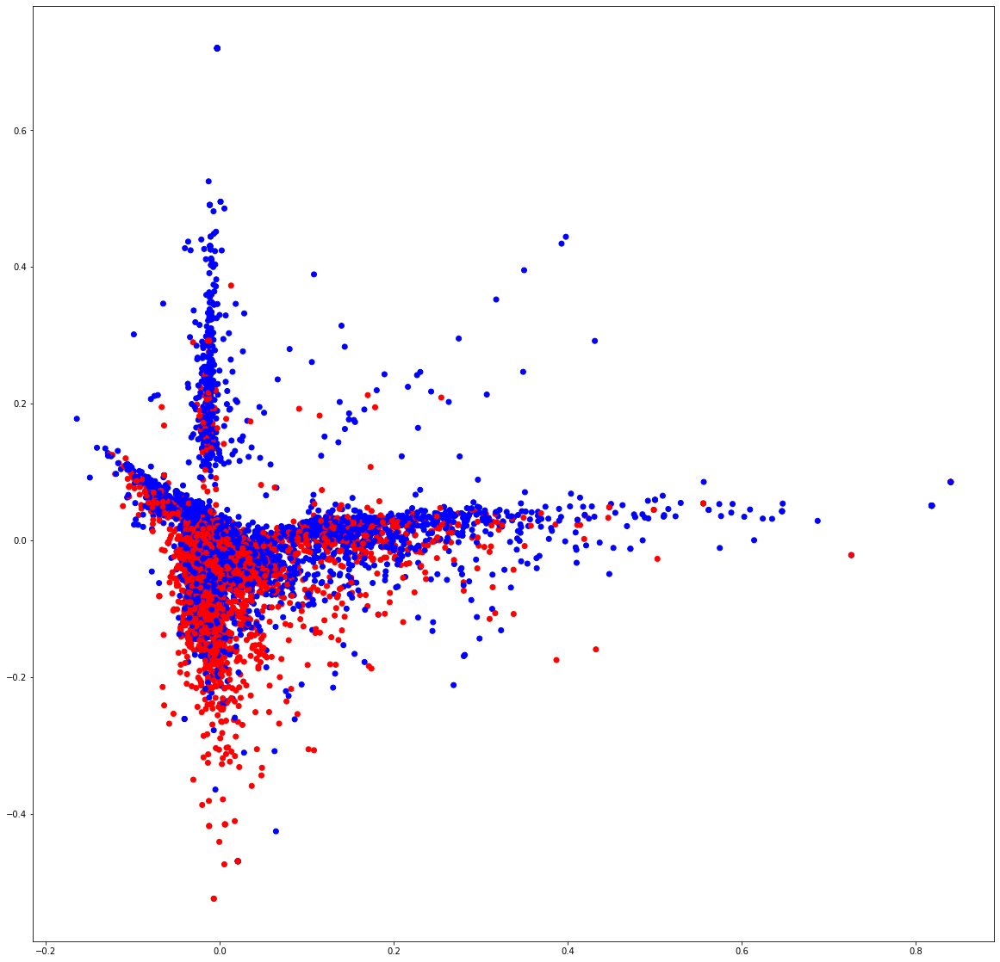

In [41]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### LSTM

In [42]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [43]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Bidirectional(LSTM(64, dropout=0.2, recurrent_dropout=0.2))(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)


model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [44]:
history = model.fit(X_train, y_train, batch_size=1024, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
1245/1245 [==============================] - 837s 665ms/step - loss: 0.5458 - accuracy: 0.7179 - val_loss: 0.5013 - val_accuracy: 0.7534
Epoch 2/10
1245/1245 [==============================] - 841s 676ms/step - loss: 0.4912 - accuracy: 0.7609 - val_loss: 0.4726 - val_accuracy: 0.7725
Epoch 3/10
1245/1245 [==============================] - 867s 697ms/step - loss: 0.4792 - accuracy: 0.7687 - val_loss: 0.4850 - val_accuracy: 0.7687
Epoch 4/10
1245/1245 [==============================] - 875s 702ms/step - loss: 0.4731 - accuracy: 0.7724 - val_loss: 0.4799 - val_accuracy: 0.7676
Epoch 5/10
1245/1245 [==============================] - 891s 716ms/step - loss: 0.4685 - accuracy: 0.7750 - val_loss: 0.4624 - val_accuracy: 0.7795
Epoch 6/10
1245/1245 [==============================] - 890s 715ms/step - loss: 0.4639 - accuracy: 0.7782 - val_loss: 0.4617 - val_accuracy: 0.7799
Epoch 7/10
1245/1245 [==============================] - 896s 720ms/step - loss: 0.4604 - accuracy: 0.7804 - val_

In [50]:
model.save('models/lstm_model.h5')